# Intel image classification

Data from the following Kaggle link : https://www.kaggle.com/datasets/puneet6060/intel-image-classification

### Content : 
This Data contains around 25k images of size 150x150 distributed under 6 categories.

* Buildings : 0
* Forests : 1 
* Glacier : 2
* Mountain : 3
* Sea : 4
* Street : 5

The Train, Test and Prediction data is separated in each zip files. There are around 14k images in Train, 3k in Test and 7k in Prediction.

# Importing libraries

In [ ]:
!pip install matplotlib --upgrade 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 11.2 MB 22.9 MB/s 
     |████████████████████████████████| 965 kB 48.8 MB/s 
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.2.2
    Uninstalling matplotlib-3.2.2:
      Successfully uninstalled matplotlib-3.2.2


In [ ]:
!pip install opendatasets

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns
import pandas as pd
import random

from glob import glob

import json
import pickle
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.utils import img_to_array, load_img
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten
from tensorflow.keras.models import Model 
from keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator 
from sklearn.metrics import roc_curve, auc, ConfusionMatrixDisplay
import scipy as sp
from matplotlib import gridspec
from tensorflow.keras.layers import GlobalAveragePooling2D

#Matplotlib and Seaborn parameters : 
from matplotlib import rcParams
rcParams['figure.figsize'] = 15,8 #Taille de la figure affichée
sns.set_style("darkgrid")#style de l'arrière plan de seaborn 
sns.set_palette("pastel")#Couleurs utilisées dans les graphiques 


# Reading Data

In [ ]:
import opendatasets as od 
od.download("https://www.kaggle.com/datasets/puneet6060/intel-image-classification/download?datasetVersionNumber=2q")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: quentinnavarre02
Your Kaggle Key: ··········


100%|██████████| 346M/346M [00:15<00:00, 23.1MB/s]


In [ ]:
# Paths : 
train_path = "intel-image-classification/seg_train/seg_train"
test_path = "intel-image-classification/seg_test/seg_test"
pred_path = "intel-image-classification/seg_pred/seg_pred"

#Files : 
train_files = glob(train_path+"/*/*.jp*g")
test_files = glob(test_path+"/*/*.jp*g")
pred_files= glob(pred_path+"/*.jp*g")

#Dataframes : 
df_train = pd.DataFrame(data= train_files,columns=["complete_path"])
df_train["class"] = df_train["complete_path"].apply(lambda x :x.split("/")[3])

df_test = pd.DataFrame(data= test_files,columns=["complete_path"])
df_test["class"] = df_test["complete_path"].apply(lambda x :x.split("/")[3])

df_pred = pd.DataFrame(data= pred_files,columns=["complete_path"])

df_train.head()

,complete_path,class
0,intel-image-classification/seg_train/seg_train...,mountain
1,intel-image-classification/seg_train/seg_train...,mountain
2,intel-image-classification/seg_train/seg_train...,mountain
3,intel-image-classification/seg_train/seg_train...,mountain
4,intel-image-classification/seg_train/seg_train...,mountain


# Exploration 

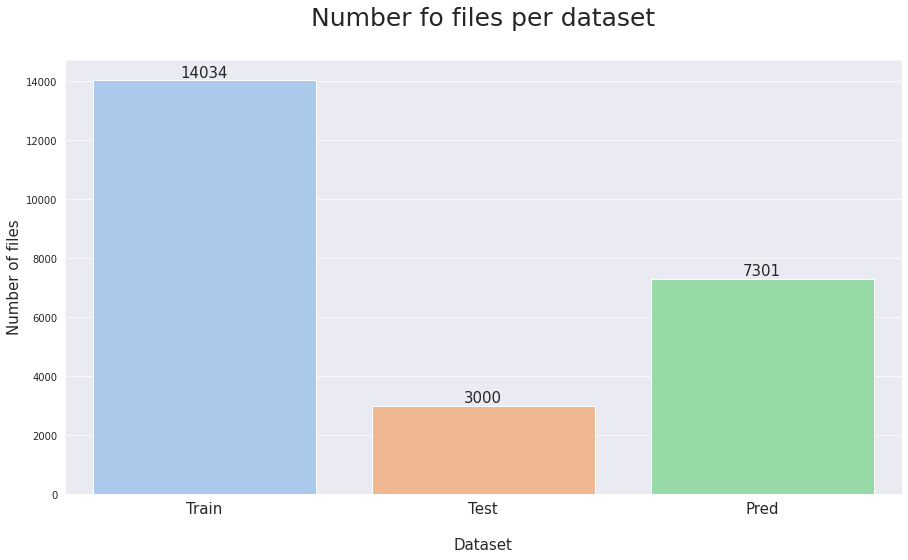

In [ ]:
#Number of files in each datasets
p= sns.barplot(data=pd.DataFrame(data=[["Train",len(train_files)],["Test",len(test_files)], ["Pred",len(pred_files)]], columns=["Dataset","Nb_files"]),
           x="Dataset",
           y="Nb_files")

for i in p.containers:
    p.bar_label(i,fontsize=15)

plt.ylabel("Number of files",fontsize=15)
plt.xlabel("\nDataset",fontsize=15)
plt.title("Number fo files per dataset\n",fontsize=25)
plt.xticks(fontsize=15)

plt.show()

### Class distribution 

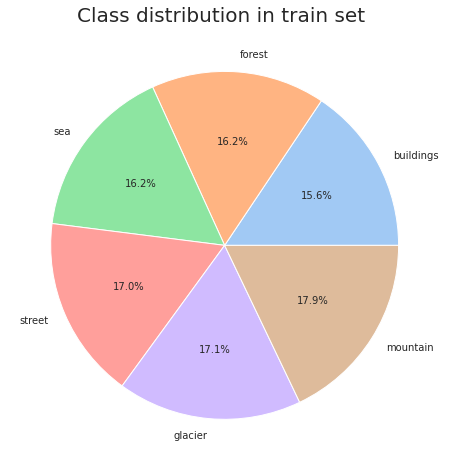

In [ ]:
p=df_train.groupby("class").agg("count").sort_values("complete_path").plot.pie(y="complete_path", autopct='%1.1f%%')
p.legend_=None
plt.title("Class distribution in train set ", fontsize=20)
plt.ylabel("")
plt.show()

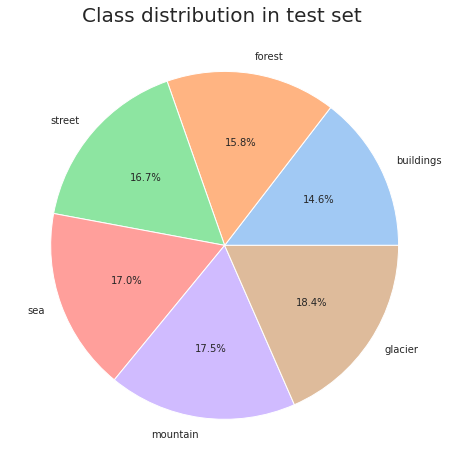

In [ ]:
p=df_test.groupby("class").agg("count").sort_values("complete_path").plot.pie(y="complete_path", autopct='%1.1f%%')
p.legend_=None
plt.title("Class distribution in test set ", fontsize=20)
plt.ylabel("")
plt.show()

# Checking image sizes : 

In [ ]:
def get_shape(x) : 
    x=img_to_array(load_img(x))
    return x.shape[0], x.shape[1], x.shape[2]

In [ ]:
df_train["shape_0"], df_train["shape_1"], df_train["shape_2"]= zip(*df_train["complete_path"].map(get_shape))
df_test["shape_0"], df_test["shape_1"], df_test["shape_2"]= zip(*df_test["complete_path"].map(get_shape))
df_pred["shape_0"], df_pred["shape_1"], df_pred["shape_2"]= zip(*df_pred["complete_path"].map(get_shape))

print("Max values for train :("+str(df_train["shape_0"].max())+","+str(df_train["shape_1"].max())+","+str(df_train["shape_2"].max())+")")
print("Max values for test :("+str(df_test["shape_0"].max())+","+str(df_test["shape_1"].max())+","+str(df_test["shape_2"].max())+")")
print("Max values for pred :("+str(df_pred["shape_0"].max())+","+str(df_pred["shape_1"].max())+","+str(df_pred["shape_2"].max())+")")

Max values for train :(150,150,3)
Max values for test :(150,150,3)
Max values for pred :(374,500,3)


In [ ]:
df_temp=pd.concat([df_train,df_test,df_pred])
print("Top 5 number of images per shape in the 3 datasets.")
df_temp.groupby(["shape_0","shape_1","shape_2"]).agg("count").sort_values("complete_path",ascending=False)[["complete_path"]].rename(columns={"complete_path":"Count"}).head()

Top 5 number of images per shape in the 3 datasets.


,,,Count
shape_0,shape_1,shape_2,
150,150,3,24267
113,150,3,7
135,150,3,3
149,150,3,3
131,150,3,3


We can see that all images does not have exactly the same shape.
The most common shape is by far (150,150,3).

# Displaying sample images 

In [ ]:
def plot_sample_images(df,num_cols, title):
    plt.figure(figsize=(15,15))
    n=0
    for class_name in df["class"].unique() : 
        df_temp=df[df["class"]==class_name]
        for count in range(num_cols):
            plt.subplot(6,num_cols,n+1)
            idx=random.randint(0,len(df_temp))
            plt.imshow(load_img(df_temp.iloc[idx,0]))
            plt.grid(None)
            plt.axis("off")
            plt.title(class_name)
            n+=1
    plt.suptitle(title,fontsize=40)
    plt.tight_layout()

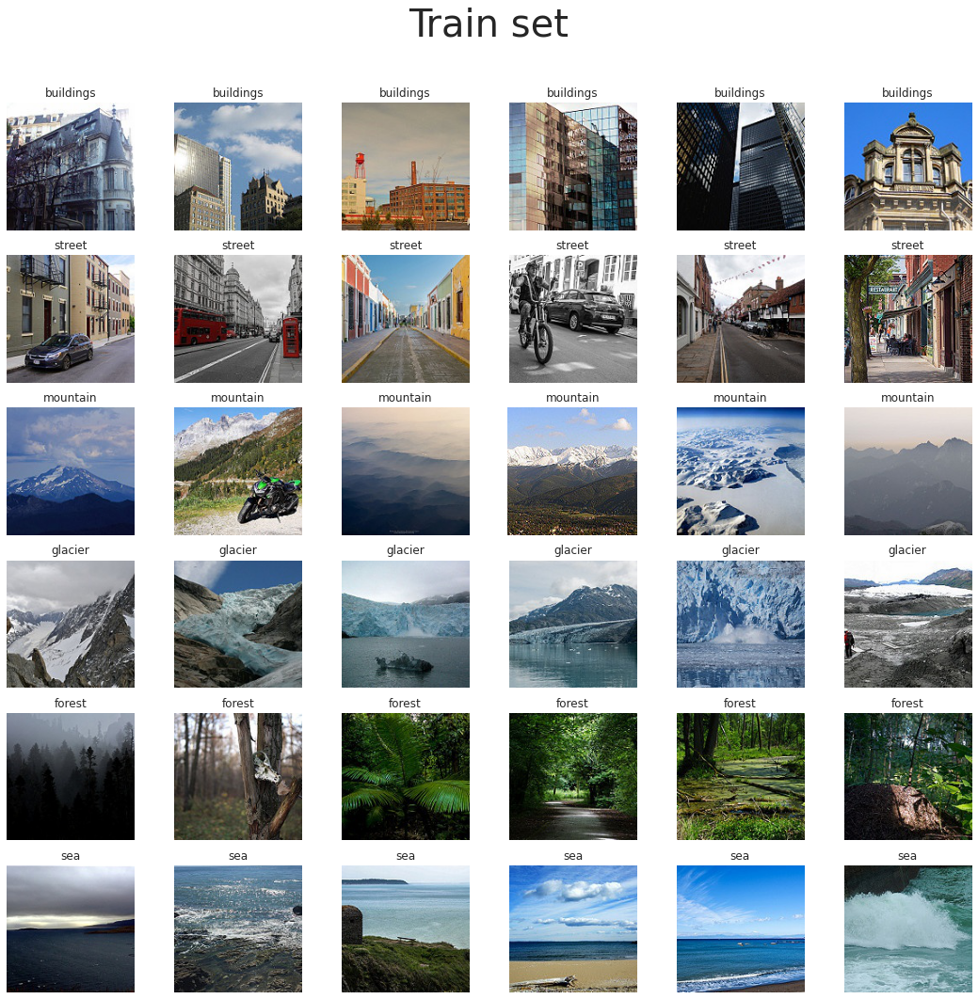

In [ ]:
plot_sample_images(df_train,6,"Train set\n")

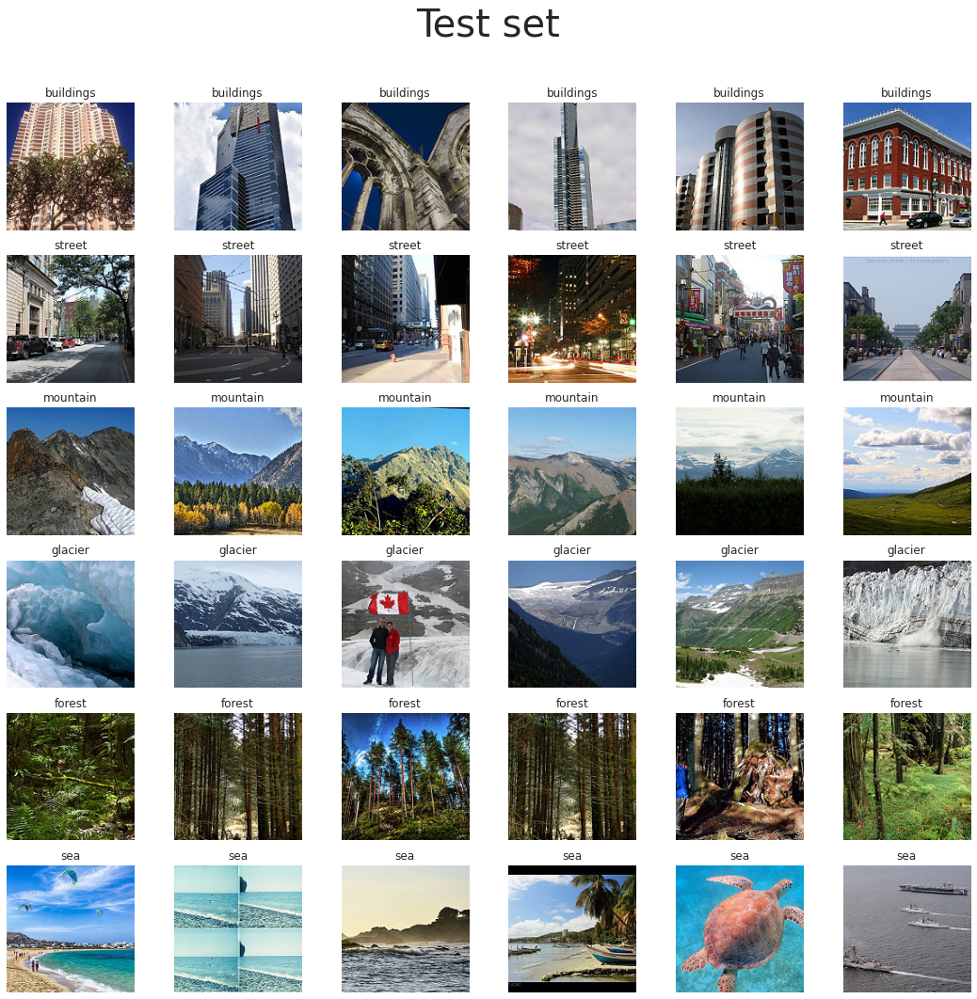

In [ ]:
plot_sample_images(df_test,6,"Test set\n")

# Models 

### Testing multiple pretrained model 

### Functions

In [ ]:
#Plot the accuracy and the loss during the training of the nn,
#The final confusion matrix , 
#The final roc auc curve 
def plot_performance_indicators(history, model, generator,model_name ):

    loss, accuracy = model.evaluate(generator, steps=generator.samples//batch_size+1)#computer loss and accuracy
    y_pred =  model.predict(generator, generator.samples // batch_size+1)
    y_pred_argmax= np.argmax(y_pred,axis=1)#We keep only the index of the class with the highest value
    
    fig, axes = plt.subplots(1,4, figsize=(22,6))
    
    # Plot accuracy
    ax= axes[0]
    ax.plot(history['accuracy'],'bo--', label = "accuracy")
    ax.plot(history['val_accuracy'], 'ro--', label = "val_accuracy")
    ax.set_title("Train_accuracy vs val_accuracy\n", fontsize=15)
    ax.set_ylabel("accuracy")
    ax.set_xlabel("epochs")
    ax.legend()

    # Plot loss function
    ax= axes[1]
    ax.plot(history['loss'],'bo--', label = "loss")
    ax.plot(history['val_loss'], 'ro--', label = "val_loss")
    ax.set_title("Train_loss vs val_loss\n", fontsize=15)
    ax.set_ylabel("loss")
    ax.set_xlabel("epochs")
    ax.legend()

    # Plot ROC AUC curve : 
    ax= axes[2]

    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    indices_to_labels = {v: k for k, v in generator.class_indices.items()}

    y_test= to_categorical(generator.classes)

    n_classes=len(generator.class_indices)
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot of a ROC curve for a specific class
    for i in range(n_classes):
        ax.plot(fpr[i], tpr[i], label=indices_to_labels[i]+' ROC curve (area = %0.3f)' % roc_auc[i], lw=2)
    ax.plot([0, 1], [0, 1], 'k--')
    ax.set_xlim([-0.01, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title('Receiver operating characteristic curves\n', fontsize=15)
    ax.legend(loc="lower right")

    # Plot confusion matrix : 
    ax= axes[3]
    disp =ConfusionMatrixDisplay.from_predictions(
                generator.classes, y_pred_argmax,
                cmap = "Blues", 
                colorbar=False, 
                ax=ax )
    
    
    ax.grid(False)
    ax.set_xticks(ticks= [i for i in range(len(generator.class_indices))],labels= list(generator.class_indices))
    ax.set_yticks(ticks= [i for i in range(len(generator.class_indices))], labels=list(generator.class_indices))
    ax.set_title("Confusion matrix\n", fontsize=15)

    plt.suptitle(f"Performance of the model : {model_name}\n",fontsize=25)
    plt.tight_layout()
    plt.show()

    return loss, accuracy


In [ ]:
#Adapt the initial model to our case 
def make_model(model_init,hidden_layers, retrain = False):
    if retrain==False : 
        for layer in model_init.layers : 
            layer.trainable= False
    
    x=hidden_layers[0](model_init.output)
    
    for layer in hidden_layers[1:] :
        x=layer(x)
    new_model =Model(model_init.input, x)
    new_model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])
    return new_model

In [ ]:
#Save loss and accurracy of the model 
drive_path ="/content/drive/MyDrive/Colab_Notebooks/Kaggle/Intel_image_classification"
model_path = drive_path +"/Models/"
checkpoints_path= drive_path +"/Checkpoints/"
loss_dict_path = drive_path+"/dict_losses.npy"
acc_dict_path =drive_path+"/dict_acc.npy"

In [ ]:
%% script false
dictionary={}

np.save(loss_dict_path, dictionary) 
np.save(acc_dict_path, dictionary) 


UsageError: Cell magic `%%` not found.


In [ ]:
def save_dicts(name_model, loss, acc): 

    loss_dict =np.load(loss_dict_path, allow_pickle="TRUE").item()
    acc_dict= np.load(acc_dict_path, allow_pickle="TRUE").item()

    loss_dict[name_model] = loss
    acc_dict[name_model] = acc

    np.save(loss_dict_path, loss_dict)
    np.save(acc_dict_path, acc_dict)
    


In [ ]:
#Create the data generators : 
def image_generator(preprocess_func):
    return ImageDataGenerator(
        rotation_range=20, 
        width_shift_range=0.1, 
        height_shift_range=0.1,
        brightness_range=[0.4,1.5],
        shear_range=0.1,
        zoom_range=0.2,
        horizontal_flip=True,
        vertical_flip=True,
         validation_split=0.2,
        preprocessing_function =preprocess_func)
    
def test_image_generator(preprocess_func):
    return ImageDataGenerator(
    preprocessing_function =preprocess_func)


def create_generators(model_init):
    image_gen= image_generator(model_init.preprocess_input)
    test_image_gen = test_image_generator(model_init.preprocess_input)

    train_generator = image_gen.flow_from_directory(
    train_path,
    target_size=image_shape[:2],
    shuffle=True,
    batch_size=batch_size,
    subset="training"
   )
    valid_generator = image_gen.flow_from_directory(
        train_path,
        target_size=image_shape[:2],
        shuffle=True,
        batch_size=batch_size,
        subset="validation"
    )

    
    test_generator = test_image_gen.flow_from_directory(
        test_path,
        target_size=image_shape[:2],
        shuffle=False, 
        batch_size=batch_size
    )
    return train_generator, valid_generator, test_generator

In [ ]:
#Parameters : 
image_shape=[150,150,3]
batch_size=32
nb_classes= df_train["class"].nunique()
nb_epochs=20

## VGG

https://keras.io/api/applications/

### Model 1

In [ ]:
model_name ="vgg16"
checkpoint_filepath=checkpoints_path+ str(model_name)+"_"

from keras.applications import vgg16
#Loading the model 
#We import the weights of the model trained on the imagenet dataset 
#We don't keep the top of the model and replace it fully connected layers to adpat it to our use case 
vgg= vgg16.VGG16(input_shape=image_shape, weights= "imagenet", include_top=False)


#Layers added to the end of the networks 
hidden_layers=[
    Flatten(),
    Dense(100, activation="relu"),
    Dense(nb_classes, activation="softmax")]
    
image_gen=image_generator(vgg16.preprocess_input)

##Create generators 
train_generator, valid_generator, test_generator= create_generators(vgg16)


model1_vgg = make_model(vgg,hidden_layers)
#model1_vgg.summary()

Found 11230 images belonging to 6 classes.
Found 2804 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


### Testing generator :

In [ ]:
print(train_generator.class_indices)
labels = [None] * len(train_generator.class_indices)
for k, v in train_generator.class_indices.items():
    labels[v] = k

{'buildings': 0, 'forest': 1, 'glacier': 2, 'mountain': 3, 'sea': 4, 'street': 5}


#### Displaying random image after preprocessing 

min: -123.68 max: 138.061


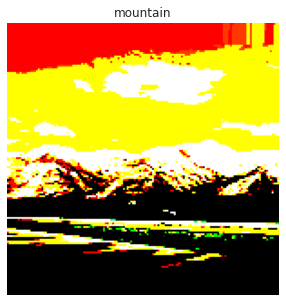

In [ ]:
for x, y in train_generator:
    print("min:", x[0].min(), "max:", x[0].max())
    plt.figure(figsize=(5,5))
    plt.title(labels[np.argmax(y[0])])
    plt.imshow(x[0])
    plt.grid(None)
    plt.axis("off")
    plt.show()
    break

In [ ]:
hist = model1_vgg.fit(train_generator,
                      steps_per_epoch = train_generator.samples // batch_size,
                      validation_data=valid_generator, 
                      validation_steps = valid_generator.samples // batch_size,
                      epochs=nb_epochs,     
            callbacks =[
              tf.keras.callbacks.EarlyStopping(
                  monitor="loss", patience=3, restore_best_weights=True),
             tf.keras.callbacks.ModelCheckpoint(
                 filepath = checkpoint_filepath+"best_val_loss.h5" , 
                 save_weights_only=False, 
                 monitor="val_loss",
                 mode="min",
                 save_best_only=True)
          ])

Epoch 1/20
350/350 [==============================] - 112s 319ms/step - loss: 1.0612 - accuracy: 0.7515 - val_loss: 0.5340 - val_accuracy: 0.8132
Epoch 2/20
350/350 [==============================] - 109s 312ms/step - loss: 0.4998 - accuracy: 0.8327 - val_loss: 0.4608 - val_accuracy: 0.8506
Epoch 3/20
350/350 [==============================] - 102s 293ms/step - loss: 0.4550 - accuracy: 0.8458 - val_loss: 0.4697 - val_accuracy: 0.8398
Epoch 4/20
350/350 [==============================] - 107s 306ms/step - loss: 0.4142 - accuracy: 0.8573 - val_loss: 0.4168 - val_accuracy: 0.8578
Epoch 5/20
350/350 [==============================] - 104s 297ms/step - loss: 0.3945 - accuracy: 0.8622 - val_loss: 0.4418 - val_accuracy: 0.8527
Epoch 6/20
350/350 [==============================] - 107s 306ms/step - loss: 0.3703 - accuracy: 0.8700 - val_loss: 0.3960 - val_accuracy: 0.8682
Epoch 7/20
350/350 [==============================] - 102s 291ms/step - loss: 0.3664 - accuracy: 0.8731 - val_loss: 0.4194 -

94/94 [==============================] - 8s 81ms/step


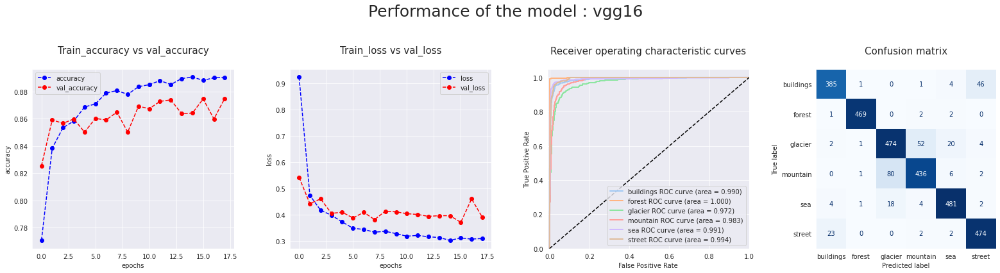

Accuracy of the last iteration model on the test dataset :  90.633 %
94/94 [==============================] - 7s 78ms/step


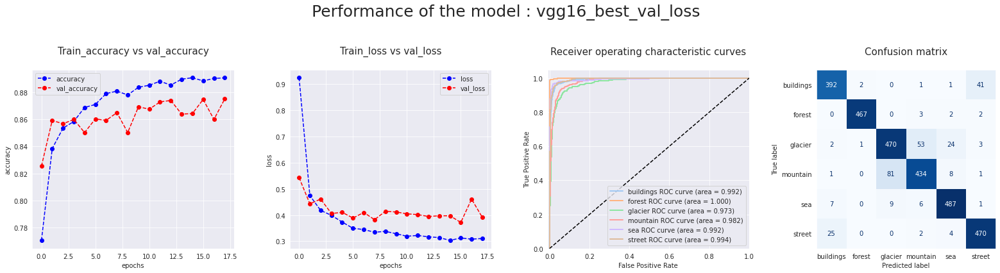

Accuracy of the model with the best validation loss on the test dataset :  90.667 %


In [ ]:
loss, acc = plot_performance_indicators(hist.history, model1_vgg , test_generator,model_name)
save_dicts(model_name , loss, acc)
print("Accuracy of the last iteration model on the test dataset : ", np.round(acc*100,3),"%")
model1_vgg.save(model_path+f"{model_name}.h5")

model_best_val= keras.models.load_model(checkpoint_filepath+"best_val_loss.h5")
loss, acc = plot_performance_indicators(hist.history, model_best_val , test_generator, f"{model_name}_best_val_loss")
save_dicts(f"{model_name}_best_val_loss", loss, acc)
print("Accuracy of the model with the best validation loss on the test dataset : ", np.round(acc*100,3),"%")
model_best_val.save(model_path+f"{model_name}_best_val_loss.h5")

### Model 2

This time we retrain all the parameters

In [ ]:
model_name ="vgg16_2_retrain_True"
checkpoint_filepath=checkpoints_path+ str(model_name)+"_"


from keras.applications import vgg16
vgg= vgg16.VGG16(input_shape=image_shape, weights= "imagenet", include_top=False)


hidden_layers=[
    Flatten(),
    Dense(100, activation="relu"),
    Dense(nb_classes, activation="softmax")]


##Create generators 
train_generator, valid_generator, test_generator= create_generators(vgg16)


model2_vgg = make_model(vgg,hidden_layers, retrain=True)
#model2_vgg.summary()

In [ ]:
hist = model2_vgg.fit(train_generator,
                      steps_per_epoch = train_generator.samples // batch_size,
                      validation_data=valid_generator, 
                      validation_steps = valid_generator.samples // batch_size,
                      epochs=20,     
            callbacks =[
              tf.keras.callbacks.EarlyStopping(
                  monitor="val_loss", patience=3, restore_best_weights=True),
             tf.keras.callbacks.ModelCheckpoint(
                 filepath = checkpoint_filepath+"best_val_loss.h5" , 
                 save_weights_only=False, 
                 monitor="val_loss",
                 mode="min",
                 save_best_only=True)
          ])

Epoch 1/20
350/350 [==============================] - 126s 342ms/step - loss: 3.4095 - accuracy: 0.3171 - val_loss: 1.2594 - val_accuracy: 0.4547
Epoch 2/20
350/350 [==============================] - 115s 328ms/step - loss: 1.1756 - accuracy: 0.5178 - val_loss: 1.0614 - val_accuracy: 0.5711
Epoch 3/20
350/350 [==============================] - 114s 325ms/step - loss: 1.0881 - accuracy: 0.5610 - val_loss: 1.0170 - val_accuracy: 0.5769
Epoch 4/20
350/350 [==============================] - 114s 326ms/step - loss: 0.9846 - accuracy: 0.6037 - val_loss: 0.9214 - val_accuracy: 0.6131
Epoch 5/20
350/350 [==============================] - 114s 324ms/step - loss: 0.8920 - accuracy: 0.6486 - val_loss: 0.9883 - val_accuracy: 0.6070
Epoch 6/20
350/350 [==============================] - 115s 328ms/step - loss: 0.8259 - accuracy: 0.6766 - val_loss: 0.6970 - val_accuracy: 0.7299
Epoch 7/20
350/350 [==============================] - 115s 328ms/step - loss: 0.7660 - accuracy: 0.7083 - val_loss: 0.6900 -

94/94 [==============================] - 7s 79ms/step


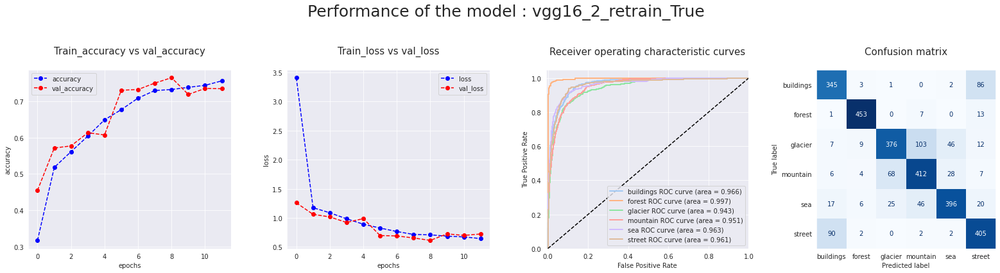

Accuracy of the last iteration model on the test dataset :  79.567 %
94/94 [==============================] - 7s 77ms/step


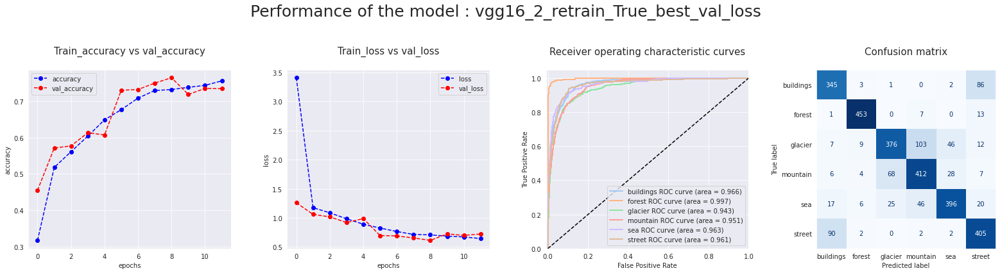

Accuracy of the model with the best validation loss on the test dataset :  79.567 %


In [ ]:
loss, acc = plot_performance_indicators(hist.history, model2_vgg , test_generator,model_name)
save_dicts(model_name , loss, acc)
print("Accuracy of the last iteration model on the test dataset : ", np.round(acc*100,3),"%")
model2_vgg.save(model_path+f"{model_name}.h5")

model_best_val= keras.models.load_model(checkpoint_filepath+"best_val_loss.h5")
loss, acc = plot_performance_indicators(hist.history, model_best_val , test_generator, f"{model_name}_best_val_loss")
save_dicts(f"{model_name}_best_val_loss", loss, acc)
print("Accuracy of the model with the best validation loss on the test dataset : ", np.round(acc*100,3),"%")
model_best_val.save(model_path+f"{model_name}_best_val_loss.h5")

This method is very long and not very efficient, hence we will stay focus on pre trained models for the other tests. 

## Resnet 

In [ ]:
model_name ="resnet50_1"
checkpoint_filepath=checkpoints_path+ str(model_name)+"_"

from tensorflow.keras.applications import resnet50
model_init= resnet50.ResNet50(input_shape=image_shape, weights= "imagenet", include_top=False)

hidden_layers=[
    Flatten(),
    Dense(100, activation="relu"),
    Dense(nb_classes, activation="softmax")]


##Create generators 
train_generator, valid_generator, test_generator= create_generators(resnet50)


model1_resnet = make_model(model_init,hidden_layers, retrain=False)
#model1_resnet.summary()

94765736/94765736 [==============================] - 5s 0us/step
Found 11230 images belonging to 6 classes.
Found 2804 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


In [ ]:
hist = model1_resnet.fit(train_generator,
                      steps_per_epoch = train_generator.samples // batch_size,
                      validation_data=valid_generator, 
                      validation_steps = valid_generator.samples // batch_size,
                      epochs=nb_epochs,     
            callbacks =[
              tf.keras.callbacks.EarlyStopping(
                  monitor="loss", patience=5, restore_best_weights=True),
             tf.keras.callbacks.ModelCheckpoint(
                 filepath = checkpoint_filepath+"best_val_loss.h5" , 
                 save_weights_only=False, 
                 monitor="val_loss",
                 mode="min",
                 save_best_only=True)
          ])

Epoch 1/20
350/350 [==============================] - 122s 308ms/step - loss: 0.8482 - accuracy: 0.8163 - val_loss: 0.4631 - val_accuracy: 0.8438
Epoch 2/20
350/350 [==============================] - 99s 283ms/step - loss: 0.3692 - accuracy: 0.8748 - val_loss: 0.4244 - val_accuracy: 0.8610
Epoch 3/20
350/350 [==============================] - 99s 282ms/step - loss: 0.3297 - accuracy: 0.8855 - val_loss: 0.3441 - val_accuracy: 0.8829
Epoch 4/20
350/350 [==============================] - 98s 279ms/step - loss: 0.3161 - accuracy: 0.8901 - val_loss: 0.3522 - val_accuracy: 0.8854
Epoch 5/20
350/350 [==============================] - 98s 281ms/step - loss: 0.2823 - accuracy: 0.8986 - val_loss: 0.3387 - val_accuracy: 0.8879
Epoch 6/20
350/350 [==============================] - 98s 279ms/step - loss: 0.2754 - accuracy: 0.9036 - val_loss: 0.3533 - val_accuracy: 0.8904
Epoch 7/20
350/350 [==============================] - 98s 281ms/step - loss: 0.2617 - accuracy: 0.9052 - val_loss: 0.3200 - val_a

94/94 [==============================] - 6s 59ms/step


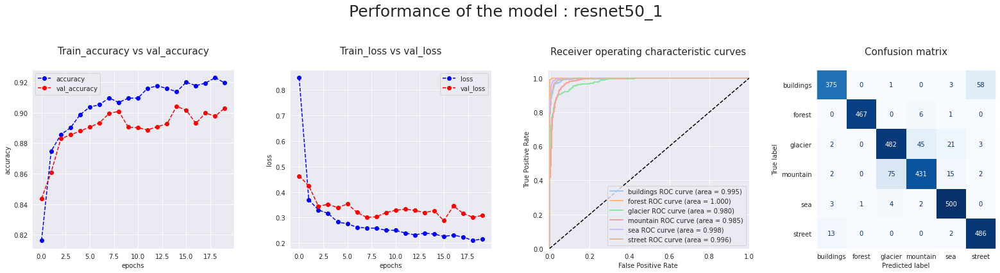

Accuracy of the last iteration model on the test dataset :  91.367 %
94/94 [==============================] - 6s 60ms/step


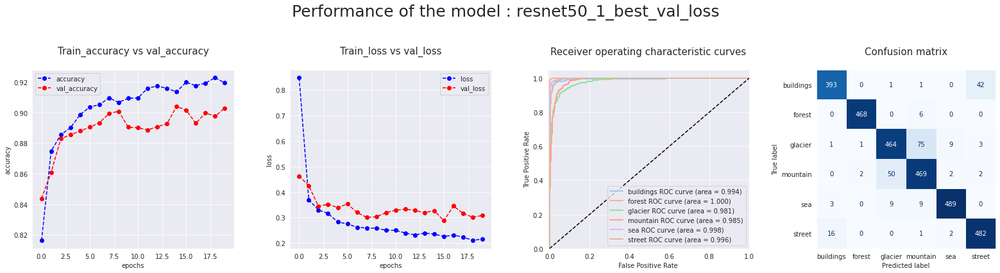

Accuracy of the model with the best validation loss on the test dataset :  92.167 %


In [ ]:
loss, acc = plot_performance_indicators(hist.history, model1_resnet , test_generator,model_name)
save_dicts(model_name , loss, acc)
print("Accuracy of the last iteration model on the test dataset : ", np.round(acc*100,3),"%")
model1_resnet.save(model_path+f"{model_name}.h5")

model_best_val= keras.models.load_model(checkpoint_filepath+"best_val_loss.h5")
loss, acc = plot_performance_indicators(hist.history, model_best_val , test_generator, f"{model_name}_best_val_loss")
save_dicts(f"{model_name}_best_val_loss", loss, acc)
print("Accuracy of the model with the best validation loss on the test dataset : ", np.round(acc*100,3),"%")
model_best_val.save(model_path+f"{model_name}_best_val_loss.h5")

## InceptionV3


In [ ]:
model_name ="InceptionV3"
checkpoint_filepath=checkpoints_path+ str(model_name)+"_"

from tensorflow.keras.applications import inception_v3
model_init= inception_v3.InceptionV3(input_shape=image_shape, weights= "imagenet", include_top=False)

hidden_layers=[
    Flatten(),
    Dense(100, activation="relu"),
    Dense(nb_classes, activation="softmax")]

##Create generators 
train_generator, valid_generator, test_generator= create_generators(inception_v3)

model1_inceptionV3 = make_model(model_init,hidden_layers, retrain=False)
#model1_inceptionV3.summary()

87910968/87910968 [==============================] - 5s 0us/step
Found 11230 images belonging to 6 classes.
Found 2804 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


In [ ]:
hist = model1_inceptionV3.fit(train_generator,
                      steps_per_epoch = train_generator.samples // batch_size,
                      validation_data=valid_generator, 
                      validation_steps = valid_generator.samples // batch_size,
                      epochs=nb_epochs,     
            callbacks =[
              tf.keras.callbacks.EarlyStopping(
                  monitor="loss", patience=5, restore_best_weights=True),
             tf.keras.callbacks.ModelCheckpoint(
                 filepath = checkpoint_filepath+"best_val_loss.h5" , 
                 save_weights_only=False, 
                 monitor="val_loss",
                 mode="min",
                 save_best_only=True)
          ])

Epoch 1/20
350/350 [==============================] - 104s 284ms/step - loss: 0.9311 - accuracy: 0.7571 - val_loss: 0.5716 - val_accuracy: 0.7985
Epoch 2/20
350/350 [==============================] - 96s 275ms/step - loss: 0.5763 - accuracy: 0.8055 - val_loss: 0.5298 - val_accuracy: 0.8186
Epoch 3/20
350/350 [==============================] - 93s 265ms/step - loss: 0.4923 - accuracy: 0.8251 - val_loss: 0.5510 - val_accuracy: 0.8161
Epoch 4/20
350/350 [==============================] - 98s 280ms/step - loss: 0.4489 - accuracy: 0.8411 - val_loss: 0.4322 - val_accuracy: 0.8488
Epoch 5/20
350/350 [==============================] - 96s 274ms/step - loss: 0.4201 - accuracy: 0.8463 - val_loss: 0.4190 - val_accuracy: 0.8603
Epoch 6/20
350/350 [==============================] - 94s 269ms/step - loss: 0.4123 - accuracy: 0.8500 - val_loss: 0.4507 - val_accuracy: 0.8398
Epoch 7/20
350/350 [==============================] - 96s 275ms/step - loss: 0.4026 - accuracy: 0.8521 - val_loss: 0.4301 - val_a

94/94 [==============================] - 6s 48ms/step


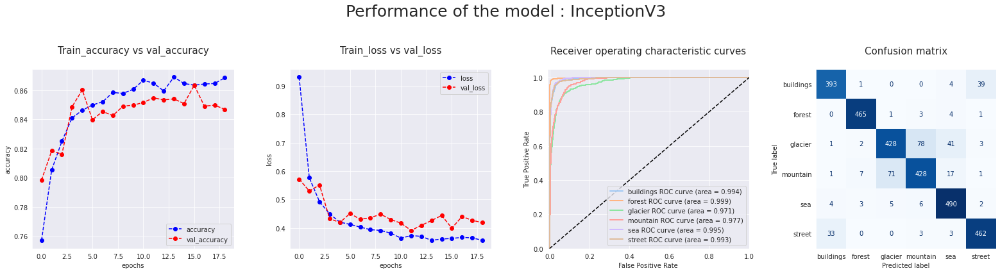

Accuracy of the last iteration model on the test dataset :  88.867 %
94/94 [==============================] - 6s 48ms/step


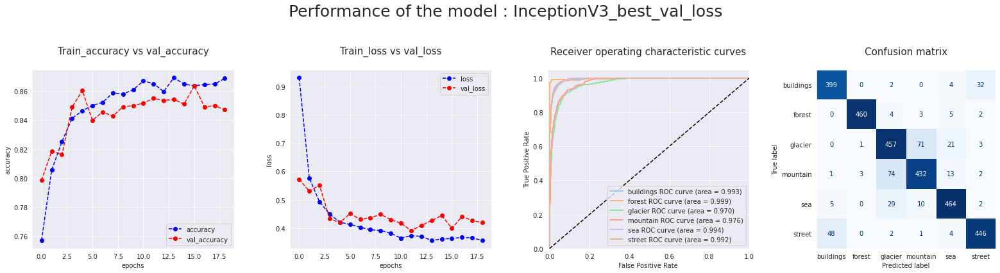

Accuracy of the model with the best validation loss on the test dataset :  88.6 %


In [ ]:
loss, acc = plot_performance_indicators(hist.history, model1_inceptionV3 , test_generator,model_name)
save_dicts(model_name , loss, acc)
print("Accuracy of the last iteration model on the test dataset : ", np.round(acc*100,3),"%")
model1_inceptionV3.save(model_path+f"{model_name}.h5")

model_best_val= keras.models.load_model(checkpoint_filepath+"best_val_loss.h5")
loss, acc = plot_performance_indicators(hist.history, model_best_val , test_generator, f"{model_name}_best_val_loss")
save_dicts(f"{model_name}_best_val_loss", loss, acc)
print("Accuracy of the model with the best validation loss on the test dataset : ", np.round(acc*100,3),"%")
model_best_val.save(model_path+f"{model_name}_best_val_loss.h5")

## Xception

In [ ]:
model_name ="Xception"
checkpoint_filepath=checkpoints_path+ str(model_name)+"_"

from tensorflow.keras.applications import xception
model_init= xception.Xception(input_shape=image_shape, weights= "imagenet", include_top=False)

hidden_layers=[
    Flatten(),
    Dense(100, activation="relu"),
    Dense(nb_classes, activation="softmax")]

##Create generators 
train_generator, valid_generator, test_generator= create_generators(xception)


model1_Xception = make_model(model_init,hidden_layers, retrain=False)
#model1_Xception.summary()

83683744/83683744 [==============================] - 4s 0us/step
Found 11230 images belonging to 6 classes.
Found 2804 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


In [ ]:
hist = model1_Xception.fit(train_generator,
                      steps_per_epoch = train_generator.samples // batch_size,
                      validation_data=valid_generator, 
                      validation_steps = valid_generator.samples // batch_size,
                      epochs=nb_epochs,     
            callbacks =[
              tf.keras.callbacks.EarlyStopping(
                  monitor="loss", patience=5, restore_best_weights=True),
             tf.keras.callbacks.ModelCheckpoint(
                 filepath = checkpoint_filepath+"best_val_loss.h5" , 
                 save_weights_only=False, 
                 monitor="val_loss",
                 mode="min",
                 save_best_only=True)
          ])

Epoch 1/20
350/350 [==============================] - 104s 287ms/step - loss: 0.7695 - accuracy: 0.7653 - val_loss: 0.5663 - val_accuracy: 0.7892
Epoch 2/20
350/350 [==============================] - 100s 285ms/step - loss: 0.4782 - accuracy: 0.8265 - val_loss: 0.4541 - val_accuracy: 0.8412
Epoch 3/20
350/350 [==============================] - 98s 279ms/step - loss: 0.4411 - accuracy: 0.8411 - val_loss: 0.4438 - val_accuracy: 0.8423
Epoch 4/20
350/350 [==============================] - 100s 285ms/step - loss: 0.4233 - accuracy: 0.8418 - val_loss: 0.4401 - val_accuracy: 0.8348
Epoch 5/20
350/350 [==============================] - 99s 284ms/step - loss: 0.4077 - accuracy: 0.8532 - val_loss: 0.3866 - val_accuracy: 0.8549
Epoch 6/20
350/350 [==============================] - 97s 278ms/step - loss: 0.3925 - accuracy: 0.8584 - val_loss: 0.3971 - val_accuracy: 0.8574
Epoch 7/20
350/350 [==============================] - 98s 280ms/step - loss: 0.3765 - accuracy: 0.8609 - val_loss: 0.3774 - val

94/94 [==============================] - 6s 61ms/step


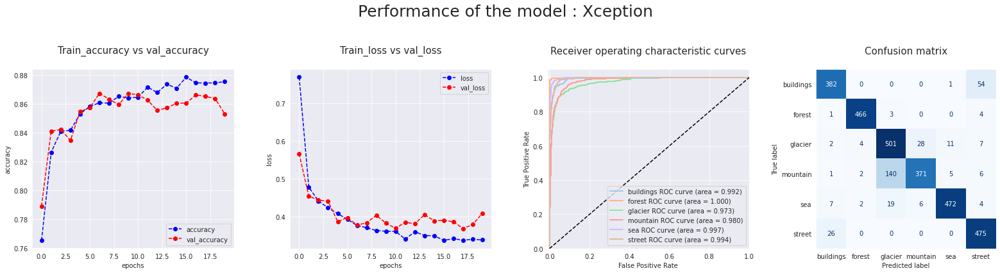

Accuracy of the last iteration model on the test dataset :  88.9 %
94/94 [==============================] - 6s 60ms/step


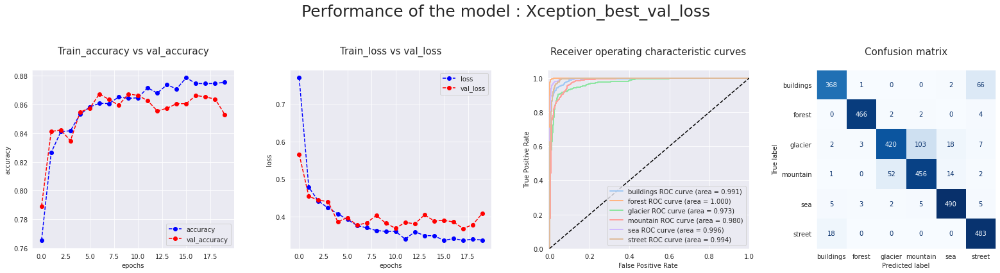

Accuracy of the model with the best validation loss on the test dataset :  89.433 %


In [ ]:
loss, acc = plot_performance_indicators(hist.history, model1_Xception , test_generator,model_name)
save_dicts(model_name , loss, acc)
print("Accuracy of the last iteration model on the test dataset : ", np.round(acc*100,3),"%")
model1_Xception.save(model_path+f"{model_name}.h5")

model_best_val= keras.models.load_model(checkpoint_filepath+"best_val_loss.h5")
loss, acc = plot_performance_indicators(hist.history, model_best_val , test_generator, f"{model_name}_best_val_loss")
save_dicts(f"{model_name}_best_val_loss", loss, acc)
print("Accuracy of the model with the best validation loss on the test dataset : ", np.round(acc*100,3),"%")
model_best_val.save(model_path+f"{model_name}_best_val_loss.h5")

## NasNetMobile

In [ ]:
model_name ="NasNetMobile"
checkpoint_filepath=checkpoints_path+ str(model_name)+"_"

from tensorflow.keras.applications import nasnet
model_init= nasnet.NASNetMobile( weights=None, include_top=False,input_shape=image_shape)

hidden_layers=[
    Flatten(),
    Dense(100, activation="relu"),
    Dense(nb_classes, activation="softmax")]

##Create generators 
train_generator, valid_generator, test_generator= create_generators(nasnet)


model1_NASNetMobile = make_model(model_init,hidden_layers, retrain=True)

Found 11230 images belonging to 6 classes.
Found 2804 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


In [ ]:
hist = model1_NASNetMobile.fit(train_generator,
                      steps_per_epoch = train_generator.samples // batch_size,
                      validation_data=valid_generator, 
                      validation_steps = valid_generator.samples // batch_size,
                      epochs=nb_epochs,     
            callbacks =[
              tf.keras.callbacks.EarlyStopping(
                  monitor="val_loss", patience=5, restore_best_weights=True),
             tf.keras.callbacks.ModelCheckpoint(
                 filepath = checkpoint_filepath+"best_val_loss.h5" , 
                 save_weights_only=False, 
                 monitor="val_loss",
                 mode="min",
                 save_best_only=True)
          ])

Epoch 1/20
350/350 [==============================] - 167s 363ms/step - loss: 1.5622 - accuracy: 0.4371 - val_loss: 6.4678 - val_accuracy: 0.1868
Epoch 2/20
350/350 [==============================] - 114s 324ms/step - loss: 1.1710 - accuracy: 0.5399 - val_loss: 31.9825 - val_accuracy: 0.1735
Epoch 3/20
350/350 [==============================] - 111s 317ms/step - loss: 1.0489 - accuracy: 0.6142 - val_loss: 7.3297 - val_accuracy: 0.3157
Epoch 4/20
350/350 [==============================] - 113s 321ms/step - loss: 0.9659 - accuracy: 0.6415 - val_loss: 11.5163 - val_accuracy: 0.3168
Epoch 5/20
350/350 [==============================] - 116s 332ms/step - loss: 1.0002 - accuracy: 0.6012 - val_loss: 6.2386 - val_accuracy: 0.2942
Epoch 6/20
350/350 [==============================] - 118s 336ms/step - loss: 0.9683 - accuracy: 0.6132 - val_loss: 4.1001 - val_accuracy: 0.1972
Epoch 7/20
350/350 [==============================] - 110s 315ms/step - loss: 0.8798 - accuracy: 0.6762 - val_loss: 8.2918

94/94 [==============================] - 9s 52ms/step


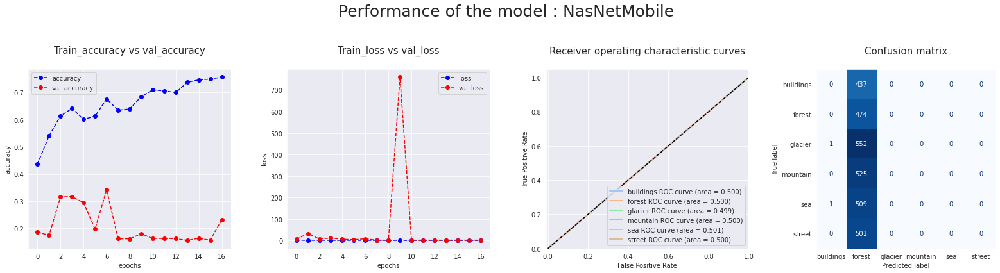

Accuracy of the last iteration model on the test dataset :  15.8 %
94/94 [==============================] - 8s 53ms/step


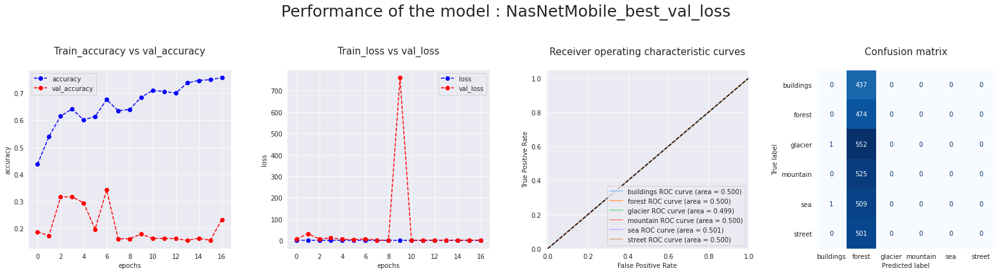

Accuracy of the model with the best validation loss on the test dataset :  15.8 %


In [ ]:
loss, acc = plot_performance_indicators(hist.history, model1_NASNetMobile , test_generator,model_name)
save_dicts(model_name , loss, acc)
print("Accuracy of the last iteration model on the test dataset : ", np.round(acc*100,3),"%")
model1_NASNetMobile.save(model_path+f"{model_name}.h5")

model_best_val= keras.models.load_model(checkpoint_filepath+"best_val_loss.h5")
loss, acc = plot_performance_indicators(hist.history, model_best_val , test_generator, f"{model_name}_best_val_loss")
save_dicts(f"{model_name}_best_val_loss", loss, acc)
print("Accuracy of the model with the best validation loss on the test dataset : ", np.round(acc*100,3),"%")
model_best_val.save(model_path+f"{model_name}_best_val_loss.h5")

The model does not learn at all. 

## InceptionResNetV2

In [ ]:
model_name ="InceptionResnetV2"
checkpoint_filepath=checkpoints_path+ str(model_name)+"_"

from tensorflow.keras.applications import inception_resnet_v2
model_init= inception_resnet_v2.InceptionResNetV2( weights=None, include_top=False,input_shape=image_shape)

hidden_layers=[
    Flatten(),
    Dense(100, activation="relu"),
    Dense(nb_classes, activation="softmax")]

##Create generators 
train_generator, valid_generator, test_generator= create_generators(inception_resnet_v2)


model1_InceptionResNetV2 = make_model(model_init,hidden_layers, retrain=False)

Found 11230 images belonging to 6 classes.
Found 2804 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


In [ ]:
hist = model1_InceptionResNetV2.fit(train_generator,
                      steps_per_epoch = train_generator.samples // batch_size,
                      validation_data=valid_generator, 
                      validation_steps = valid_generator.samples // batch_size,
                      epochs=nb_epochs,     
            callbacks =[
              tf.keras.callbacks.EarlyStopping(
                  monitor="loss", patience=5, restore_best_weights=True),
             tf.keras.callbacks.ModelCheckpoint(
                 filepath = checkpoint_filepath+"best_val_loss.h5" , 
                 save_weights_only=False, 
                 monitor="val_loss",
                 mode="min",
                 save_best_only=True)
          ])

Epoch 1/20
350/350 [==============================] - 116s 299ms/step - loss: 1.5924 - accuracy: 0.3396 - val_loss: 1.4629 - val_accuracy: 0.4239
Epoch 2/20
350/350 [==============================] - 101s 289ms/step - loss: 1.3760 - accuracy: 0.4546 - val_loss: 1.3122 - val_accuracy: 0.4846
Epoch 3/20
350/350 [==============================] - 104s 298ms/step - loss: 1.2604 - accuracy: 0.5055 - val_loss: 1.2451 - val_accuracy: 0.4939
Epoch 4/20
350/350 [==============================] - 100s 287ms/step - loss: 1.1966 - accuracy: 0.5355 - val_loss: 1.1798 - val_accuracy: 0.5503
Epoch 5/20
350/350 [==============================] - 102s 293ms/step - loss: 1.1659 - accuracy: 0.5405 - val_loss: 1.1524 - val_accuracy: 0.5596
Epoch 6/20
350/350 [==============================] - 102s 293ms/step - loss: 1.1322 - accuracy: 0.5643 - val_loss: 1.1267 - val_accuracy: 0.5693
Epoch 7/20
350/350 [==============================] - 103s 293ms/step - loss: 1.1113 - accuracy: 0.5730 - val_loss: 1.1042 -

94/94 [==============================] - 11s 82ms/step


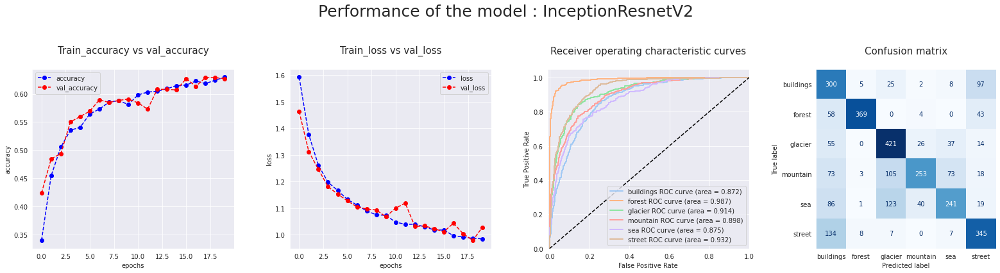

Accuracy of the last iteration model on the test dataset :  64.3 %
94/94 [==============================] - 11s 82ms/step


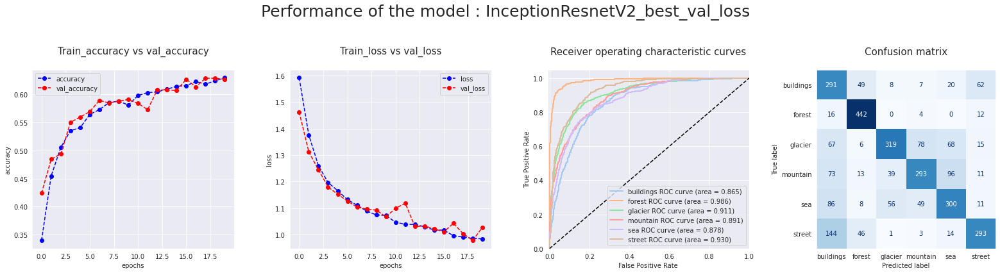

Accuracy of the model with the best validation loss on the test dataset :  64.6 %


In [ ]:
loss, acc = plot_performance_indicators(hist.history, model1_InceptionResNetV2 , test_generator,model_name)
save_dicts(model_name , loss, acc)
print("Accuracy of the last iteration model on the test dataset : ", np.round(acc*100,3),"%")
model1_InceptionResNetV2.save(model_path+f"{model_name}.h5")

model_best_val= keras.models.load_model(checkpoint_filepath+"best_val_loss.h5")
loss, acc = plot_performance_indicators(hist.history, model_best_val , test_generator, f"{model_name}_best_val_loss")
save_dicts(f"{model_name}_best_val_loss", loss, acc)
print("Accuracy of the model with the best validation loss on the test dataset : ", np.round(acc*100,3),"%")
model_best_val.save(model_path+f"{model_name}_best_val_loss.h5")

The model is underfitting but it is too long to train on more epochs

## Resnet101

In [ ]:
model_name ="resnet101"
checkpoint_filepath=checkpoints_path+ str(model_name)+"_"


from tensorflow.keras.applications import resnet
model_init= resnet.ResNet101(input_shape=image_shape, weights= "imagenet", include_top=False)

hidden_layers=[
    Flatten(),
    Dense(100, activation="relu"),
    Dense(nb_classes, activation="softmax")]


##Create generators 
train_generator, valid_generator, test_generator= create_generators(resnet)


model1_resnet101 = make_model(model_init,hidden_layers, retrain=False)
#model1_resnet101.summary()

171446536/171446536 [==============================] - 9s 0us/step
Found 11230 images belonging to 6 classes.
Found 2804 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


In [ ]:
hist = model1_resnet101.fit(train_generator,
                      steps_per_epoch = train_generator.samples // batch_size,
                      validation_data=valid_generator, 
                      validation_steps = valid_generator.samples // batch_size,
                      epochs=25,     
            callbacks =[
              tf.keras.callbacks.EarlyStopping(
                  monitor="loss", patience=5, restore_best_weights=True),
             tf.keras.callbacks.ModelCheckpoint(
                 filepath = checkpoint_filepath+'best_val_loss.h5' , 
                 save_weights_only=False, 
                 monitor="val_loss",
                 mode="min",
                 save_best_only=True)
          ])

Epoch 1/25
350/350 [==============================] - 111s 299ms/step - loss: 0.8679 - accuracy: 0.8015 - val_loss: 0.4871 - val_accuracy: 0.8391
Epoch 2/25
350/350 [==============================] - 102s 292ms/step - loss: 0.4425 - accuracy: 0.8475 - val_loss: 0.4341 - val_accuracy: 0.8614
Epoch 3/25
350/350 [==============================] - 102s 292ms/step - loss: 0.3802 - accuracy: 0.8702 - val_loss: 0.3772 - val_accuracy: 0.8725
Epoch 4/25
350/350 [==============================] - 102s 291ms/step - loss: 0.3394 - accuracy: 0.8857 - val_loss: 0.3582 - val_accuracy: 0.8912
Epoch 5/25
350/350 [==============================] - 99s 282ms/step - loss: 0.3126 - accuracy: 0.8944 - val_loss: 0.3729 - val_accuracy: 0.8721
Epoch 6/25
350/350 [==============================] - 99s 282ms/step - loss: 0.3015 - accuracy: 0.8977 - val_loss: 0.3649 - val_accuracy: 0.8775
Epoch 7/25
350/350 [==============================] - 102s 290ms/step - loss: 0.2872 - accuracy: 0.8986 - val_loss: 0.3201 - v

94/94 [==============================] - 11s 104ms/step


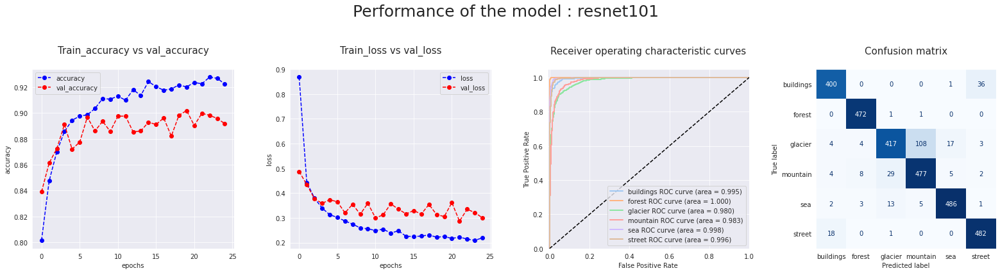

Accuracy of the last iteration model on the test dataset :  91.133 %
94/94 [==============================] - 11s 102ms/step


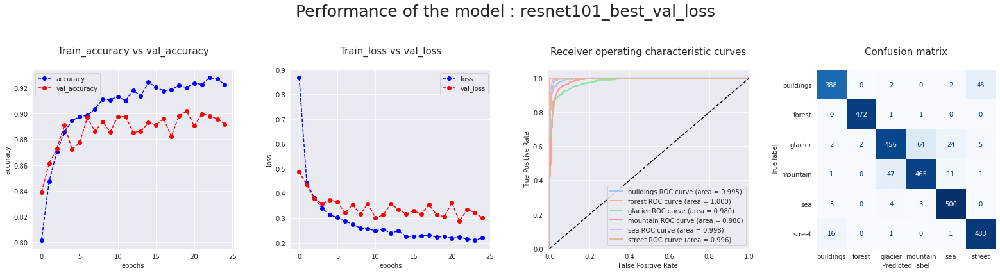

Accuracy of the model with the best validation loss on the test dataset :  92.133 %


In [ ]:
loss, acc = plot_performance_indicators(hist.history, model1_resnet101 , test_generator,model_name)
save_dicts(model_name , loss, acc)
print("Accuracy of the last iteration model on the test dataset : ", np.round(acc*100,3),"%")
model1_resnet101.save(model_path+f"{model_name}.h5")

model_best_val= keras.models.load_model(checkpoint_filepath+"best_val_loss.h5")
loss, acc = plot_performance_indicators(hist.history, model_best_val , test_generator, f"{model_name}_best_val_loss")
save_dicts(f"{model_name}_best_val_loss", loss, acc)
print("Accuracy of the model with the best validation loss on the test dataset : ", np.round(acc*100,3),"%")
model_best_val.save(model_path+f"{model_name}_best_val_loss.h5")

### Resnet101V2

In [ ]:
model_name ="resnet101V2"
checkpoint_filepath=checkpoints_path+ str(model_name)+"_"

from tensorflow.keras.applications import resnet_v2
model_init= resnet_v2.ResNet101V2(input_shape=image_shape, weights= "imagenet", include_top=False)

hidden_layers=[
    Flatten(),
    Dense(100, activation="relu"),
    Dense(nb_classes, activation="softmax")]


##Create generators 
train_generator, valid_generator, test_generator= create_generators(resnet_v2)


model1_resnet101V2 = make_model(model_init,hidden_layers, retrain=False)
#model1_resnet101V2.summary()

171317808/171317808 [==============================] - 8s 0us/step
Found 11230 images belonging to 6 classes.
Found 2804 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


In [ ]:
hist = model1_resnet101V2.fit(train_generator,
                      steps_per_epoch = train_generator.samples // batch_size,
                      validation_data=valid_generator, 
                      validation_steps = valid_generator.samples // batch_size,
                      epochs=20,     
            callbacks =[
              tf.keras.callbacks.EarlyStopping(
                  monitor="loss", patience=5, restore_best_weights=True),
             tf.keras.callbacks.ModelCheckpoint(
                 filepath = checkpoint_filepath+"best_val_loss.h5" , 
                 save_weights_only=False, 
                 monitor="val_loss",
                 mode="min",
                 save_best_only=True)
          ])

Epoch 1/20
350/350 [==============================] - 109s 293ms/step - loss: 0.8113 - accuracy: 0.7812 - val_loss: 0.5813 - val_accuracy: 0.7967
Epoch 2/20
350/350 [==============================] - 100s 285ms/step - loss: 0.4616 - accuracy: 0.8391 - val_loss: 0.4549 - val_accuracy: 0.8387
Epoch 3/20
350/350 [==============================] - 99s 283ms/step - loss: 0.4115 - accuracy: 0.8597 - val_loss: 0.3960 - val_accuracy: 0.8675
Epoch 4/20
350/350 [==============================] - 100s 286ms/step - loss: 0.3840 - accuracy: 0.8644 - val_loss: 0.3720 - val_accuracy: 0.8721
Epoch 5/20
350/350 [==============================] - 100s 285ms/step - loss: 0.3672 - accuracy: 0.8663 - val_loss: 0.3712 - val_accuracy: 0.8631
Epoch 6/20
350/350 [==============================] - 97s 276ms/step - loss: 0.3450 - accuracy: 0.8779 - val_loss: 0.3786 - val_accuracy: 0.8682
Epoch 7/20
350/350 [==============================] - 97s 277ms/step - loss: 0.3361 - accuracy: 0.8779 - val_loss: 0.3869 - va

94/94 [==============================] - 10s 91ms/step


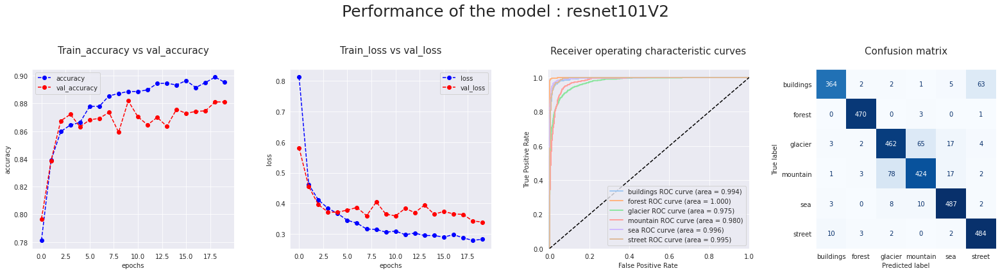

Accuracy of the last iteration model on the test dataset :  89.7 %
94/94 [==============================] - 10s 94ms/step


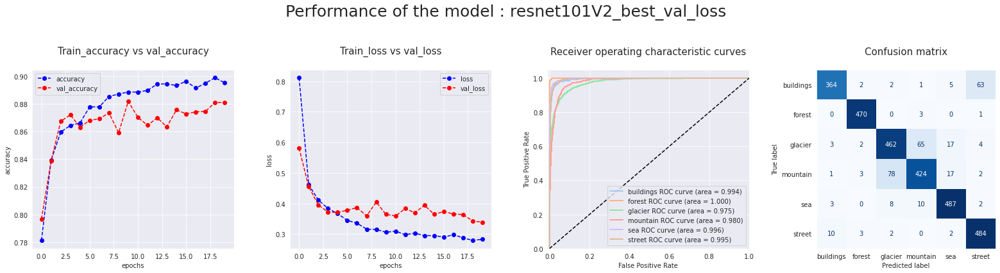

Accuracy of the model with the best validation loss on the test dataset :  89.7 %


In [ ]:
loss, acc = plot_performance_indicators(hist.history, model1_resnet101V2 , test_generator,model_name)
save_dicts(model_name , loss, acc)
print("Accuracy of the last iteration model on the test dataset : ", np.round(acc*100,3),"%")
model1_resnet101V2.save(model_path+f"{model_name}.h5")

model_best_val= keras.models.load_model(checkpoint_filepath+"best_val_loss.h5")
loss, acc = plot_performance_indicators(hist.history, model_best_val , test_generator, f"{model_name}_best_val_loss")
save_dicts(f"{model_name}_best_val_loss", loss, acc)
print("Accuracy of the model with the best validation loss on the test dataset : ", np.round(acc*100,3),"%")
model_best_val.save(model_path+f"{model_name}_best_val_loss.h5")

## VGG19

In [ ]:
model_name ="VGG19"
checkpoint_filepath=checkpoints_path+ str(model_name)+"_"

from tensorflow.keras.applications import vgg19

model_init= vgg19.VGG19(input_shape=image_shape, weights= "imagenet", include_top=False)

hidden_layers=[
    Flatten(),
    Dense(100, activation="relu"),
    Dense(nb_classes, activation="softmax")]


##Create generators 
train_generator, valid_generator, test_generator= create_generators(vgg19)


model1_vgg19 = make_model(model_init,hidden_layers, retrain=False)
#model1_vgg19.summary()

In [ ]:
hist = model1_vgg19.fit(train_generator,
                      steps_per_epoch = train_generator.samples // batch_size,
                      validation_data=valid_generator, 
                      validation_steps = valid_generator.samples // batch_size,
                      epochs=20,     
            callbacks =[
              tf.keras.callbacks.EarlyStopping(
                  monitor="loss", patience=5, restore_best_weights=True),
             tf.keras.callbacks.ModelCheckpoint(
                 filepath = checkpoint_filepath+"best_val_loss.h5" , 
                 save_weights_only=False, 
                 monitor="val_loss",
                 mode="min",
                 save_best_only=True)
          ])

Epoch 1/20
350/350 [==============================] - 103s 286ms/step - loss: 0.9126 - accuracy: 0.7643 - val_loss: 0.6294 - val_accuracy: 0.7777
Epoch 2/20
350/350 [==============================] - 98s 281ms/step - loss: 0.5065 - accuracy: 0.8271 - val_loss: 0.4758 - val_accuracy: 0.8491
Epoch 3/20
350/350 [==============================] - 99s 282ms/step - loss: 0.4236 - accuracy: 0.8506 - val_loss: 0.4398 - val_accuracy: 0.8585
Epoch 4/20
350/350 [==============================] - 96s 275ms/step - loss: 0.3975 - accuracy: 0.8599 - val_loss: 0.4434 - val_accuracy: 0.8567
Epoch 5/20
350/350 [==============================] - 98s 279ms/step - loss: 0.3718 - accuracy: 0.8670 - val_loss: 0.4026 - val_accuracy: 0.8585
Epoch 6/20
350/350 [==============================] - 98s 280ms/step - loss: 0.3522 - accuracy: 0.8746 - val_loss: 0.3940 - val_accuracy: 0.8610
Epoch 7/20
350/350 [==============================] - 97s 277ms/step - loss: 0.3383 - accuracy: 0.8733 - val_loss: 0.4028 - val_a

94/94 [==============================] - 9s 98ms/step


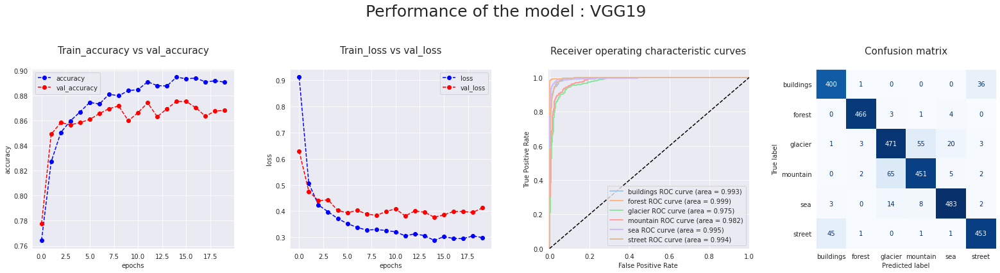

Accuracy of the last iteration model on the test dataset :  90.8 %
94/94 [==============================] - 10s 101ms/step


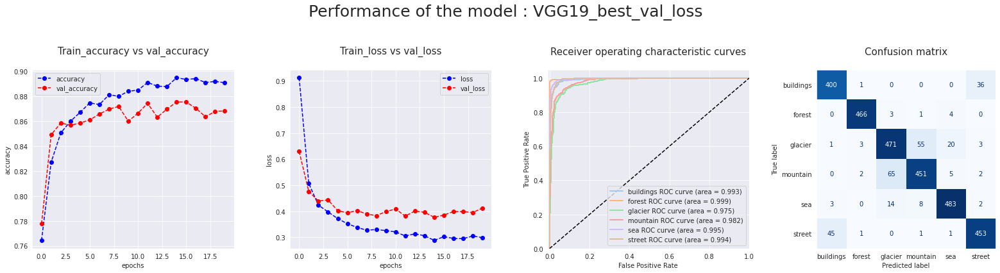

Accuracy of the model with the best validation loss on the test dataset :  90.8 %


In [ ]:
loss, acc = plot_performance_indicators(hist.history, model1_vgg19 , test_generator,model_name)
save_dicts(model_name , loss, acc)
print("Accuracy of the last iteration model on the test dataset : ", np.round(acc*100,3),"%")
model1_vgg19.save(model_path+f"{model_name}.h5")

model_best_val= keras.models.load_model(checkpoint_filepath+"best_val_loss.h5")
loss, acc = plot_performance_indicators(hist.history, model_best_val , test_generator, f"{model_name}_best_val_loss")
save_dicts(f"{model_name}_best_val_loss", loss, acc)
print("Accuracy of the model with the best validation loss on the test dataset : ", np.round(acc*100,3),"%")
model_best_val.save(model_path+f"{model_name}_best_val_loss.h5")

## Resnet with global average pooling


In [ ]:
model_name ="resnet101_GAP"
checkpoint_filepath=checkpoints_path+ str(model_name)+"_"


from tensorflow.keras.applications import resnet
model_init= resnet.ResNet101(input_shape=image_shape, weights= "imagenet", include_top=False)

hidden_layers=[
    GlobalAveragePooling2D(),
    Dense(100, activation="relu"),
    Dense(nb_classes, activation="softmax")]


##Create generators 
train_generator, valid_generator, test_generator= create_generators(resnet)


model1_resnet101 = make_model(model_init,hidden_layers, retrain=False)
#model1_resnet101.summary()

171446536/171446536 [==============================] - 8s 0us/step
Found 11230 images belonging to 6 classes.
Found 2804 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


In [ ]:
hist = model1_resnet101.fit(train_generator,
                      steps_per_epoch = train_generator.samples // batch_size,
                      validation_data=valid_generator, 
                      validation_steps = valid_generator.samples // batch_size,
                      epochs=20,     
            callbacks =[
              tf.keras.callbacks.EarlyStopping(
                  monitor="loss", patience=5, restore_best_weights=True),
             tf.keras.callbacks.ModelCheckpoint(
                 filepath = checkpoint_filepath+"best_val_loss.h5" , 
                 save_weights_only=False, 
                 monitor="val_loss",
                 mode="min",
                 save_best_only=True)
          ])

Epoch 1/20
350/350 [==============================] - 127s 345ms/step - loss: 0.4525 - accuracy: 0.8368 - val_loss: 0.3532 - val_accuracy: 0.8728
Epoch 2/20
350/350 [==============================] - 111s 316ms/step - loss: 0.3289 - accuracy: 0.8777 - val_loss: 0.3352 - val_accuracy: 0.8743
Epoch 3/20
350/350 [==============================] - 111s 317ms/step - loss: 0.2935 - accuracy: 0.8914 - val_loss: 0.3112 - val_accuracy: 0.8851
Epoch 4/20
350/350 [==============================] - 109s 310ms/step - loss: 0.2818 - accuracy: 0.8922 - val_loss: 0.3115 - val_accuracy: 0.8886
Epoch 5/20
350/350 [==============================] - 111s 318ms/step - loss: 0.2755 - accuracy: 0.8970 - val_loss: 0.3082 - val_accuracy: 0.8890
Epoch 6/20
350/350 [==============================] - 112s 321ms/step - loss: 0.2611 - accuracy: 0.9029 - val_loss: 0.2922 - val_accuracy: 0.8969
Epoch 7/20
350/350 [==============================] - 110s 314ms/step - loss: 0.2529 - accuracy: 0.9036 - val_loss: 0.2806 -

94/94 [==============================] - 11s 103ms/step


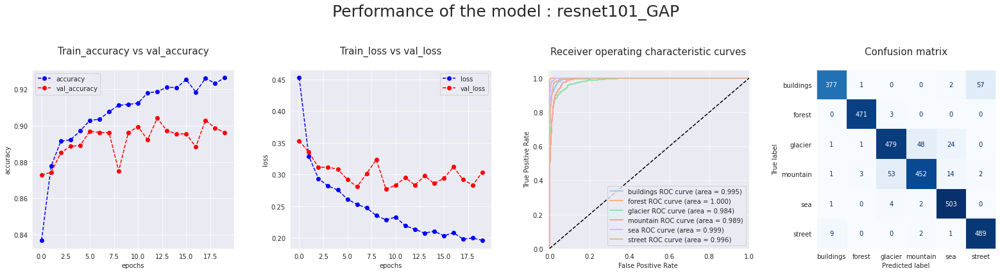

Accuracy of the last iteration model on the test dataset :  92.367 %
94/94 [==============================] - 12s 105ms/step


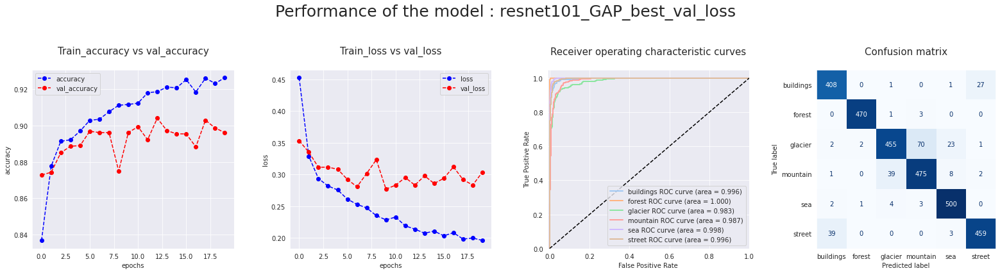

Accuracy of the model with the best validation loss on the test dataset :  92.233 %


In [ ]:
loss, acc = plot_performance_indicators(hist.history, model1_resnet101 , test_generator,model_name)
save_dicts(model_name , loss, acc)
print("Accuracy of the last iteration model on the test dataset : ", np.round(acc*100,3),"%")
model1_resnet101.save(model_path+f"{model_name}.h5")

model_best_val= keras.models.load_model(checkpoint_filepath+"best_val_loss.h5")
loss, acc = plot_performance_indicators(hist.history, model_best_val , test_generator, f"{model_name}_best_val_loss")
save_dicts(f"{model_name}_best_val_loss", loss, acc)
print("Accuracy of the model with the best validation loss on the test dataset : ", np.round(acc*100,3),"%")
model_best_val.save(model_path+f"{model_name}_best_val_loss.h5")

# Results 

In [ ]:
model_paths =  glob(model_path+"*")
dict_acc= np.load(acc_dict_path, allow_pickle="TRUE").item()
dict_loss= np.load(loss_dict_path, allow_pickle="TRUE").item()

df_results = pd.DataFrame(columns=["Path","Model_name","loss","accuracy"])
for path in model_paths : 
    df_results=df_results.append({"Path":path, "Model_name":path[80:-3], "loss": dict_loss[path[80:-3]], "accuracy":dict_acc[path[80:-3]]}, ignore_index=True)

df_results["rounded_accuracy"] = np.round(df_results["accuracy"]*100,2)
df_results["rounded_loss"] = np.round(df_results["loss"],3)

df_results.head()



,Path,Model_name,loss,accuracy,rounded_accuracy,rounded_loss
0,/content/drive/MyDrive/Colab_Notebooks/Kaggle/...,vgg16,0.316302,0.906333,90.63,0.316
1,/content/drive/MyDrive/Colab_Notebooks/Kaggle/...,vgg16_best_val_loss,0.329076,0.906667,90.67,0.329
2,/content/drive/MyDrive/Colab_Notebooks/Kaggle/...,NasNetMobile,1.803289,0.158000,15.80,1.803
3,/content/drive/MyDrive/Colab_Notebooks/Kaggle/...,NasNetMobile_best_val_loss,1.803289,0.158000,15.80,1.803
4,/content/drive/MyDrive/Colab_Notebooks/Kaggle/...,InceptionResnetV2,0.942028,0.643000,64.30,0.942


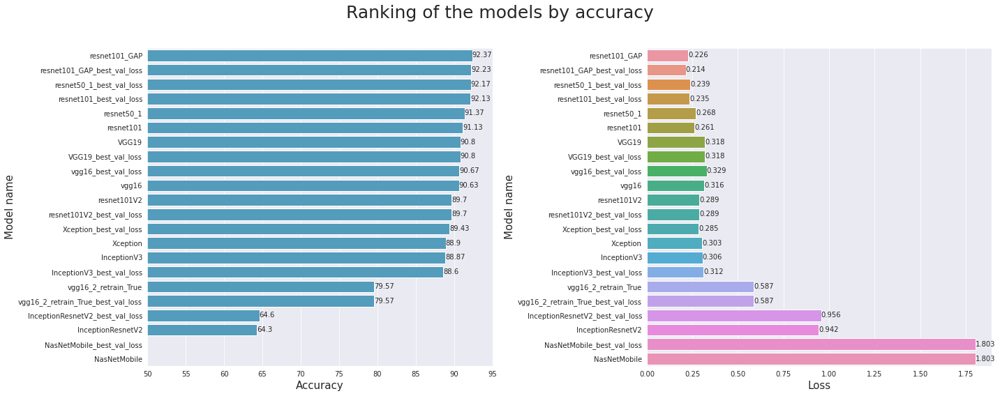

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(20,8))

ax=axes[0]
p=sns.barplot(data =df_results.sort_values("accuracy",ascending=False), y="Model_name",x="rounded_accuracy",color="#43a3cc", ax=ax)
ax.set_ylabel("Model name",fontsize=15)
ax.set_xlabel("Accuracy",fontsize=15)
ax.set_xlim((50,95))
for i in p.containers:
    p.bar_label(i,fontsize=10)

ax=axes[1]
p=sns.barplot(data =df_results.sort_values("accuracy",ascending=False), y="Model_name",x="rounded_loss",ax=ax)
ax.set_ylabel("Model name",fontsize=15)
ax.set_xlabel("Loss",fontsize=15)
for i in p.containers:
    p.bar_label(i,fontsize=10)

plt.suptitle("Ranking of the models by accuracy\n",fontsize=25)
plt.tight_layout()

# Error analysis for resnet101

We analyse the errors of the model with the best accuracy on the test set 

In [ ]:
def graphs_errors_models(generator, y_pred) : 
    fig, axes = plt.subplots(1,2, figsize=(17,8))

    y_pred_argmax= np.argmax(y_pred, axis=1)

    ax= axes[0]
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    indices_to_labels = {v: k for k, v in generator.class_indices.items()}

    y_test= to_categorical(generator.classes)

    n_classes=len(generator.class_indices)
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])


    # Plot of a ROC curve for a specific class
    for i in range(n_classes):
        ax.plot(fpr[i], tpr[i], label=indices_to_labels[i]+' ROC curve (area = %0.3f)' % roc_auc[i], lw=2)
    ax.plot([0, 1], [0, 1], 'k--')
    ax.set_xlim([-0.01, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title('ROC curves\n', fontsize=15)
    ax.legend(loc="lower right")

    # Plot Roc AUC curve : 
    ax= axes[1]
    disp =ConfusionMatrixDisplay.from_predictions(
                    generator.classes, y_pred_argmax,
                    cmap = "Blues", 
                    colorbar=False, 
                    ax=ax )
        
        
    ax.grid(False)
    ax.set_xticks(ticks= [i for i in range(len(generator.class_indices))],labels= list(generator.class_indices))
    ax.set_yticks(ticks= [i for i in range(len(generator.class_indices))], labels=list(generator.class_indices))
    ax.set_title("Confusion matrix\n", fontsize=15)

    plt.suptitle(f"Performance of the model\n",fontsize=25)
    plt.tight_layout()
    plt.show()

In [ ]:
def plot_error_images(df,num_cols,num_rows, title):
    plt.figure(figsize=(num_cols*3,num_rows*5+3))
    n=0
    idx =random.randint(0,len(df))
    list_idx =[]
    for col in range(num_cols): 
        for row in range(num_rows): 
            plt.subplot(6,num_cols,n+1)
            while idx in list_idx : 
                idx= random.randint(0,len(df))
            list_idx.append(idx)

            plt.imshow(load_img(df.iloc[idx,0]))
            plt.grid(None)
            plt.axis("off")
            plt.title(f"True : {df.iloc[idx,2]} \nPredicted : {df.iloc[idx,4]}")
            n+=1
    plt.suptitle(title,fontsize=25)
    plt.tight_layout()

In [ ]:
from keras.applications import resnet
path='/content/drive/MyDrive/Colab_Notebooks/Kaggle/Intel_image_classification/Models/resnet50_1_best_val_loss.h5'
model =  keras.models.load_model(path)

##Create generators 
train_generator, valid_generator, test_generator= create_generators(resnet)

#Create prediction dataframe : 
df_test_predictions=  pd.DataFrame()
df_test_predictions["filepath"]=test_generator.filepaths
df_test_predictions["filename"]=test_generator.filenames
df_test_predictions["class"]=df_test_predictions["filename"].apply(lambda x :x.split("/")[0])

#Predicting on the test dataset : 
y_pred = model.predict(test_generator, test_generator.samples//batch_size+1)


df_test_predictions["prediction_indice"]= np.argmax(y_pred,axis=1)
df_test_predictions["predicted_label"]=df_test_predictions["prediction_indice"].map({v:k for k,v in test_generator.class_indices.items()})
df_test_predictions[list(test_generator.class_indices.keys())] = y_pred

df_test_predictions[list(test_generator.class_indices.keys())]=df_test_predictions[list(test_generator.class_indices.keys())].apply(lambda x :np.round(x*100,3))

df_errors =df_test_predictions[df_test_predictions["predicted_label"]!=df_test_predictions["class"]]

Found 11230 images belonging to 6 classes.
Found 2804 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.
94/94 [==============================] - 9s 76ms/step


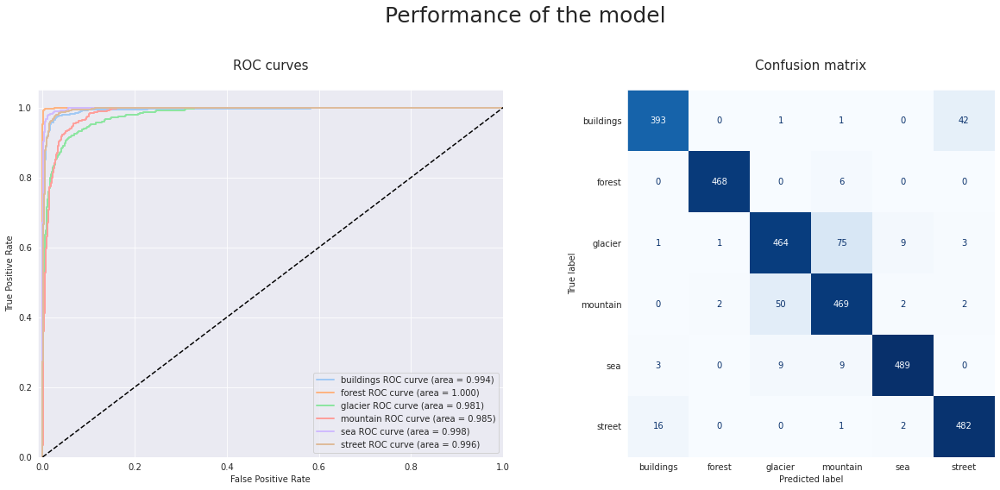

In [ ]:
graphs_errors_models(test_generator, y_pred)

Order of the classes by percentage of valid predictions : 
1. Forest
2. Sea
3. Street
4. Buildings
5. Mountain
6. Glacier 

We can see that the model has difficulties to dissociate :
* Mountains and glaciers 
* Streets and buildings

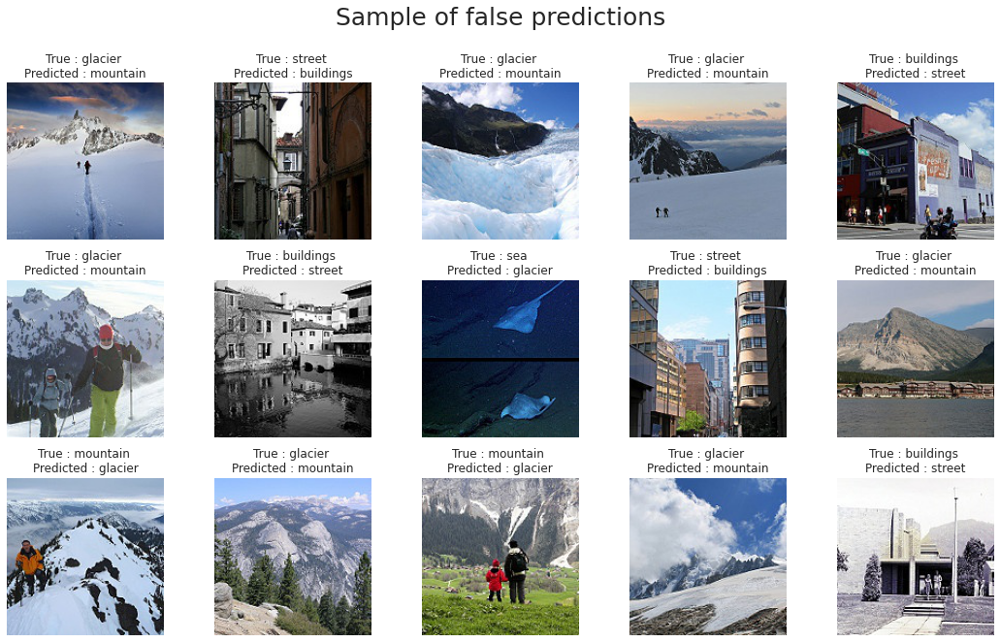

In [ ]:
plot_error_images(df_errors, 5,3,"Sample of false predictions\n")

The errors seem pretty consistent since some images could belong to 2 classes. 

### Activation maps 

In [ ]:
def index_of_last_conv(model): 
    id =0
    for i in range(len(model.layers)) : 
        if "conv" in model.layers[i].name : 
            id= i 
    return id 

In [ ]:
def plot_activation_maps(model,df,preprocess_function, num_cols, num_rows,title, name_activation_layer=0):

    if name_activation_layer ==0 : 
        activation_layer =model.layers[index_of_last_conv(model)] 
    else : 
        activation_layer= model.get_layer(name_activation_layer)

    model_class_activation =Model(inputs=model.input, outputs=activation_layer.output)

    W=model.layers[-1].get_weights()[0]



    generator = test_image_generator(preprocess_function).flow_from_dataframe(
        df,
        x_col='filepath',
        y_col='class',
        target_size=image_shape[:2],
        batch_size=batch_size,
        shuffle=False)


    fmaps =  model_class_activation.predict(generator, generator.samples // batch_size+1)# n x 5 x 5 x 2048


    #get predicted classes :
    df_predictions =pd.DataFrame() 

    y_preds= model.predict(generator, generator.samples//batch_size+1)
    
    df_predictions["filepaths"]=generator.filepaths
    df_predictions["y_pred"] = np.argmax(y_preds,axis=1) 

    df_predictions["true_class"]=generator.classes

    df_predictions["predicted_label"] = df_predictions["y_pred"].map({v:k for k,v in generator.class_indices.items()})
    df_predictions["true_label"]=df_predictions["true_class"].map({v:k for k,v in generator.class_indices.items()})
    

    fig = plt.figure(figsize=(num_cols*7, num_rows*4+2))
    outer = gridspec.GridSpec(num_rows, num_cols, wspace=0.2, hspace=0.2)


    n=0
    idx =random.randint(0,len(df_predictions))
    list_idx =[]

    for col in range(num_cols): 
        for row in range(num_rows): 
            #Generating random index
           
            while idx in list_idx : 
                idx= random.randint(0,len(df_predictions))
            list_idx.append(idx)

            #Loading image : 
            img = load_img(df_predictions.iloc[idx, 0 ], target_size=image_shape[:2])
            
            w= W[:,df_predictions.iloc[idx,1]]# Weights of the final layer for the predicted class 


            img =load_img(df_predictions.iloc[idx,0])
            #Plotting the results :
            inner = gridspec.GridSpecFromSubplotSpec(1, 2,
                    subplot_spec=outer[n], wspace=0.1, hspace=0.1)
            

            init= np.zeros((fmaps[idx].shape[0],fmaps[idx].shape[1]))
            for i in range(fmaps[idx].shape[0]) : 
                for j in range(fmaps[idx].shape[1]):
                    init[i,j]=sum(abs(fmaps[idx][i,j]))

            cam =sp.ndimage.zoom(init, (30, 30),order=1)

            ax=plt.Subplot(fig, inner[0])
            ax.imshow(img, alpha=0.8)
            ax.imshow(cam,cmap="jet", alpha=0.5)
            ax.grid(None)
            ax.axis("off")
            ax.set_title(f"Predicted label : {df_predictions.iloc[idx,3]}",fontsize=10)
            fig.add_subplot(ax)
            


            ax=plt.Subplot(fig, inner[1])
            ax.imshow(img)
            ax.set_title(f"True label : {df_predictions.iloc[idx,4]}", fontsize=10)
            ax.grid(None)
            ax.axis("off")
            fig.add_subplot(ax)
            n+=1

    plt.suptitle(title,fontsize=25)
    plt.tight_layout()
    
    plt.show()


Found 3000 validated image filenames belonging to 6 classes.
94/94 [==============================] - 6s 59ms/step


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


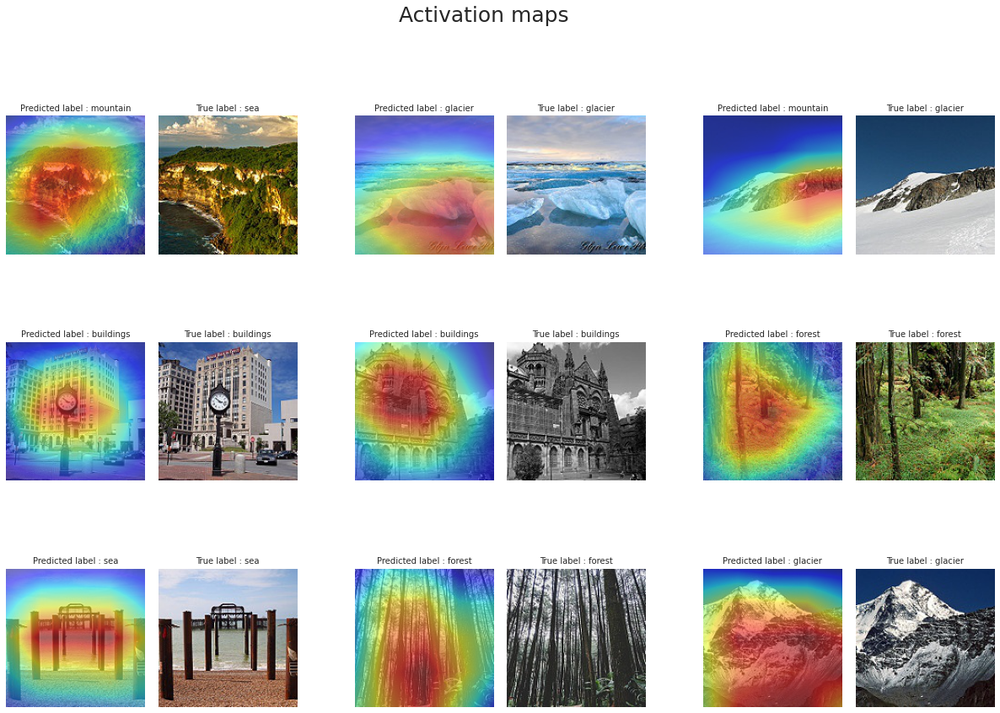

In [ ]:
from tensorflow.keras.applications.resnet50 import preprocess_input

#We display over the images the heatmaps where the heatmaps of the 
#areas where the model is the most active;
#Red => sum(abs(weights of this area)) is higher
#Blue => sum(abs(weights of this area)) is lower

plot_activation_maps(model, df_test_predictions, preprocess_input, 3,3, "Activation maps")

Found 235 validated image filenames belonging to 6 classes.
8/8 [==============================] - 0s 55ms/step


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


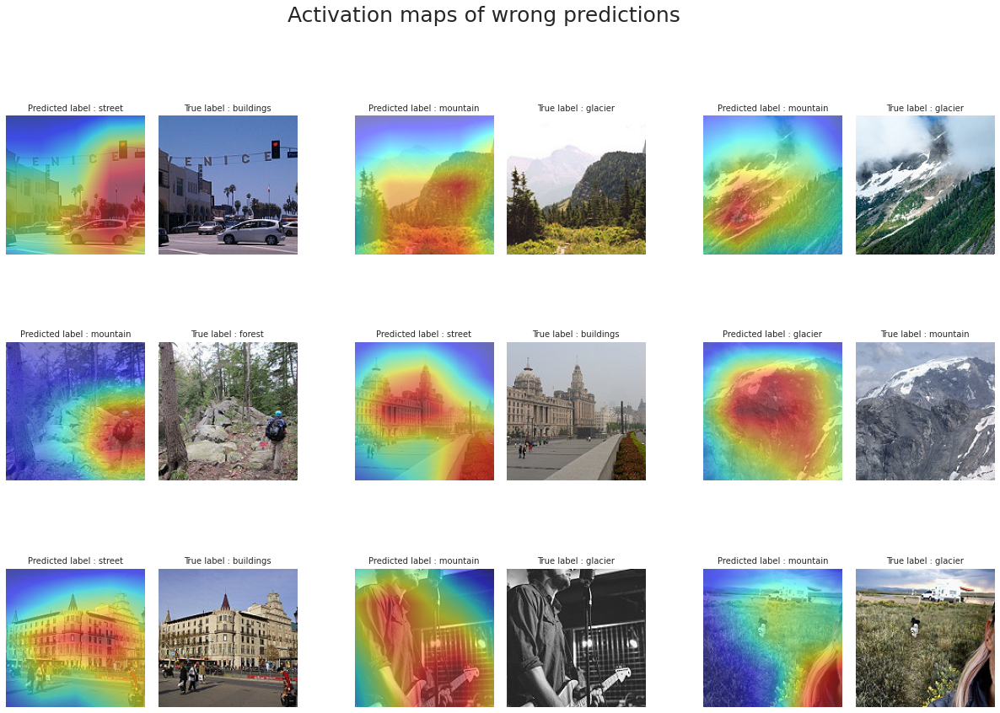

In [ ]:
plot_activation_maps(model, df_test_predictions[df_test_predictions["class"]!=df_test_predictions["predicted_label"]], preprocess_input, 3,3, "Activation maps of wrong predictions")

# Creating ensembles 

## First try 

We fit a model to predict the classes based on other models predictions

We load the 5 models with the best results to create an ensemble

In [ ]:
#Plot the accuracy and the loss during the training of the nn,
#The confusion matrix , 
#The roc auc curve 
def plot_performance_indicators_ensemble(history, model, generator, n_samples ):
    loss, accuracy = model.evaluate(generator, steps=n_samples//batch_size+1)
    y_pred =  model.predict(generator, steps = n_samples// batch_size+1)
    y_pred_argmax= np.argmax(y_pred,axis=1)
    
    fig, axes = plt.subplots(1,4, figsize=(22,6))
    
    # Plot accuracy
    ax= axes[0]
    ax.plot(history['accuracy'],'bo--', label = "accuracy")
    ax.plot(history['val_accuracy'], 'ro--', label = "val_accuracy")
    ax.set_title("Train_accuracy vs val_accuracy\n", fontsize=15)
    ax.set_ylabel("accuracy")
    ax.set_xlabel("epochs")
    ax.legend()

    # Plot loss function
    ax= axes[1]
    ax.plot(history['loss'],'bo--', label = "loss")
    ax.plot(history['val_loss'], 'ro--', label = "val_loss")
    ax.set_title("Train_loss vs val_loss\n", fontsize=15)
    ax.set_ylabel("loss")
    ax.set_xlabel("epochs")
    ax.legend()

    # Plot confusion matrix : 
    ax= axes[2]

    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    indices_to_labels = {v: k for k, v in generator.class_indices.items()}

    y_test= to_categorical(generator.classes)

    n_classes=len(generator.class_indices)
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot of a ROC curve for a specific class
    for i in range(n_classes):
        ax.plot(fpr[i], tpr[i], label=indices_to_labels[i]+' ROC curve (area = %0.3f)' % roc_auc[i], lw=2)
    ax.plot([0, 1], [0, 1], 'k--')
    ax.set_xlim([-0.01, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title('Receiver operating characteristic curves\n', fontsize=15)
    ax.legend(loc="lower right")

    # Plot Roc AUC curve : 
    ax= axes[3]
    disp =ConfusionMatrixDisplay.from_predictions(
                generator.classes, y_pred_argmax,
                cmap = "Blues", 
                colorbar=False, 
                ax=ax )
    
    
    ax.grid(False)
    ax.set_xticks(ticks= [i for i in range(len(generator.class_indices))],labels= list(generator.class_indices))
    ax.set_yticks(ticks= [i for i in range(len(generator.class_indices))], labels=list(generator.class_indices))
    ax.set_title("Confusion matrix\n", fontsize=15)

    plt.suptitle(f"Performance of the model : {model.name}\n",fontsize=25)
    plt.tight_layout()
    plt.show()

    return loss, accuracy


In [ ]:
df_results.sort_values("accuracy",ascending=False).head(10)

,Path,Model_name,loss,accuracy,rounded_accuracy,rounded_loss
20,/content/drive/MyDrive/Colab_Notebooks/Kaggle/...,resnet101_GAP,0.225866,0.923667,92.37,0.226
21,/content/drive/MyDrive/Colab_Notebooks/Kaggle/...,resnet101_GAP_best_val_loss,0.213932,0.922333,92.23,0.214
13,/content/drive/MyDrive/Colab_Notebooks/Kaggle/...,resnet50_1_best_val_loss,0.238926,0.921667,92.17,0.239
7,/content/drive/MyDrive/Colab_Notebooks/Kaggle/...,resnet101_best_val_loss,0.234522,0.921333,92.13,0.235
12,/content/drive/MyDrive/Colab_Notebooks/Kaggle/...,resnet50_1,0.268384,0.913667,91.37,0.268
6,/content/drive/MyDrive/Colab_Notebooks/Kaggle/...,resnet101,0.261391,0.911333,91.13,0.261
10,/content/drive/MyDrive/Colab_Notebooks/Kaggle/...,VGG19,0.318239,0.908000,90.80,0.318
11,/content/drive/MyDrive/Colab_Notebooks/Kaggle/...,VGG19_best_val_loss,0.318239,0.908000,90.80,0.318
1,/content/drive/MyDrive/Colab_Notebooks/Kaggle/...,vgg16_best_val_loss,0.329076,0.906667,90.67,0.329
0,/content/drive/MyDrive/Colab_Notebooks/Kaggle/...,vgg16,0.316302,0.906333,90.63,0.316


## Loading the models 

In [ ]:
resnet101_GAP=keras.models.load_model(df_results.loc[df_results["Model_name"]=="resnet101_GAP", "Path"].iloc[0])
resnet101_GAP._name = "model_resnet101_GAP"

resnet50=keras.models.load_model(df_results.loc[df_results["Model_name"]=="resnet50_1_best_val_loss", "Path"].iloc[0])
resnet50._name = "model_resnet50"

resnet101=keras.models.load_model(df_results.loc[df_results["Model_name"]=="resnet101_best_val_loss", "Path"].iloc[0])
resnet101._name = "model_resnet101"

VGG19=keras.models.load_model(df_results.loc[df_results["Model_name"]=="VGG19", "Path"].iloc[0])
VGG19._name = "model_VGG19"

VGG16=keras.models.load_model(df_results.loc[df_results["Model_name"]=="vgg16_best_val_loss", "Path"].iloc[0])
VGG16._name = "model_VGG16"

## Importing inputs preprocessing

In [ ]:
from tensorflow.keras.applications import resnet
from tensorflow.keras.applications import vgg19
from keras.applications import vgg16

## Creating the data generators

In [ ]:
#Create the data generators : 
train_image_data_generator_ensemble=ImageDataGenerator(
                                rotation_range=20, 
                                width_shift_range=0.1, 
                                height_shift_range=0.1,
                                brightness_range=[0.4,1.5],
                                shear_range=0.1,
                                zoom_range=0.2,
                                horizontal_flip=True,
                                vertical_flip=True,
                                validation_split=0.2)

train_generator_ensemble = train_image_data_generator_ensemble.flow_from_directory(
                                                                    train_path,
                                                                    target_size=image_shape[:2],
                                                                    shuffle=True,
                                                                    batch_size=batch_size,
                                                                    subset="training"
                                                                )


valid_generator_ensemble = train_image_data_generator_ensemble.flow_from_directory(
                                                                        train_path,
                                                                        target_size=image_shape[:2],
                                                                        shuffle=True,
                                                                        batch_size=batch_size,
                                                                        subset="validation"
                                                                    )

test_generator_ensemble = ImageDataGenerator().flow_from_directory(
                                                        test_path,
                                                        target_size=image_shape[:2],
                                                        shuffle=False, 
                                                        batch_size=batch_size
                                                    )

def mygen(image_gen):
  for x,y in image_gen:
    yield [resnet.preprocess_input(x),resnet.preprocess_input(x),resnet.preprocess_input(x), vgg19.preprocess_input(x), vgg16.preprocess_input(x)], y 


final_train_gen_ensemble = mygen(train_generator_ensemble)
final_valid_gen_ensemble = mygen(valid_generator_ensemble)
final_test_gen_ensemble = mygen(test_generator_ensemble)



Found 11230 images belonging to 6 classes.
Found 2804 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


### We test the train generator

In [ ]:
for x,y in final_train_gen_ensemble : 
    print(np.array(x).shape)
    print(np.array(y).shape)
    break

(5, 32, 150, 150, 3)
(32, 6)


We can see that the generator is returning 5 batches as inputs (one for each model) and on batch as output

## Renaming model layers

We have to rename the layers to avoid the "unique name layer" issue

In [ ]:
input_models= [resnet101_GAP,resnet50, resnet101, VGG19, VGG16]

for model in input_models : 
    for layer in model.layers : 
        layer._name = model.name+"_"+layer.name


In [ ]:
for layer in VGG16.layers : 
    print(layer.name)

model_VGG16_input_2
model_VGG16_block1_conv1
model_VGG16_block1_conv2
model_VGG16_block1_pool
model_VGG16_block2_conv1
model_VGG16_block2_conv2
model_VGG16_block2_pool
model_VGG16_block3_conv1
model_VGG16_block3_conv2
model_VGG16_block3_conv3
model_VGG16_block3_pool
model_VGG16_block4_conv1
model_VGG16_block4_conv2
model_VGG16_block4_conv3
model_VGG16_block4_pool
model_VGG16_block5_conv1
model_VGG16_block5_conv2
model_VGG16_block5_conv3
model_VGG16_block5_pool
model_VGG16_flatten_1
model_VGG16_dense_2
model_VGG16_dense_3


## Disabling the training of the input models 

In [ ]:
for model in input_models : 
    for layer in model.layers : 
            layer.trainable= False

## Creating the model 

In [ ]:
from tensorflow.keras.layers import concatenate

concat_layer= concatenate([resnet101_GAP.output,resnet50.output, resnet101.output, VGG19.output,VGG16.output])

z=Dense(len(input_models) *len(train_generator_ensemble.class_indices) )(concat_layer)
final = Dense(len(train_generator_ensemble.class_indices), activation="softmax")(z)


model_ensemble = Model(inputs= [resnet101_GAP.input,resnet50.input, resnet101.input, VGG19.input, VGG16.input], outputs= final)
print(f"Number of layers in the ensemble model : {len(model_ensemble.layers)}")

Number of layers in the ensemble model : 924


## Compiling the model

In [ ]:
model_ensemble.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])

## Ploting the ensemble model :

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(model_ensemble, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

## Fiting the ensemble

In [ ]:
hist = model_ensemble.fit(final_train_gen_ensemble,
                      steps_per_epoch = train_generator_ensemble.samples // batch_size,
                      validation_data=final_valid_gen_ensemble, 
                      validation_steps = valid_generator_ensemble.samples // batch_size,
                      epochs=15,     
            callbacks =[
              tf.keras.callbacks.EarlyStopping(
                  monitor="loss", patience=5, restore_best_weights=True),
             tf.keras.callbacks.ModelCheckpoint(
                 filepath ="/content/drive/MyDrive/Colab_Notebooks/Kaggle/Intel_image_classification/ensemble_best_val_loss.h5", 
                 save_weights_only=False, 
                 monitor="val_loss",
                 mode="min",
                 save_best_only=True)
          ])

Epoch 1/15
350/350 [==============================] - 231s 600ms/step - loss: 0.7617 - accuracy: 0.7911 - val_loss: 0.5266 - val_accuracy: 0.8269
Epoch 2/15
350/350 [==============================] - 192s 548ms/step - loss: 0.4650 - accuracy: 0.8446 - val_loss: 0.4983 - val_accuracy: 0.8355
Epoch 3/15
350/350 [==============================] - 192s 548ms/step - loss: 0.4593 - accuracy: 0.8451 - val_loss: 0.4873 - val_accuracy: 0.8373
Epoch 4/15
350/350 [==============================] - 182s 519ms/step - loss: 0.4459 - accuracy: 0.8466 - val_loss: 0.4986 - val_accuracy: 0.8312
Epoch 5/15
350/350 [==============================] - 180s 514ms/step - loss: 0.4569 - accuracy: 0.8450 - val_loss: 0.5002 - val_accuracy: 0.8305
Epoch 6/15
350/350 [==============================] - 190s 542ms/step - loss: 0.4486 - accuracy: 0.8471 - val_loss: 0.4839 - val_accuracy: 0.8276
Epoch 7/15
350/350 [==============================] - 203s 581ms/step - loss: 0.4486 - accuracy: 0.8501 - val_loss: 0.4795 -

## Results

In [ ]:
model_ensemble._name="Ensemble1"
loss, acc  = model_ensemble.evaluate(final_test_gen_ensemble, steps=test_generator_ensemble.samples//batch_size+1)
save_dicts(model_ensemble.name , loss, acc)
print("Accuracy of the last iteration model on the test dataset : ", np.round(acc*100,3),"%")
model_ensemble.save(model_path+f"{model_name}.h5")

model_best_val= keras.models.load_model("/content/drive/MyDrive/Colab_Notebooks/Kaggle/Intel_image_classification/ensemble_best_val_loss.h5")
model_best_val._name = "Ensemble1_best_val_loss"
loss, acc  = model_ensemble.evaluate(final_test_gen_ensemble, steps=test_generator_ensemble.samples//batch_size+1)
save_dicts(model_ensemble.name , loss, acc)
print("Accuracy of the model with the best validation loss on the test dataset : ", np.round(acc*100,3),"%")
model_best_val.save(model_path+f"{model_name}_best_val_loss.h5")

94/94 [==============================] - 40s 423ms/step - loss: 0.3464 - accuracy: 0.8853
Accuracy of the last iteration model on the test dataset :  88.533 %
94/94 [==============================] - 40s 420ms/step - loss: 0.3464 - accuracy: 0.8853
Accuracy of the model with the best validation loss on the test dataset :  88.533 %


## Second try

We fit a model to predict based on the global average pooling of other pretrained models. 

The idea behind combining models is to increase the number of features detected by the model on which we make the predictions 

In [ ]:
#We choose the 3 best performing models : resnet50, resnet101 and VGG19

#Loading the models :
resnet101 = tf.keras.applications.resnet.ResNet101(input_shape=image_shape, weights="imagenet", include_top=False)
resnet101._name = "model_resnet101_GAP"

resnet50 = tf.keras.applications.resnet.ResNet50(input_shape=image_shape, weights="imagenet", include_top=False)
resnet50._name = "model_resnet50_GAP"

VGG19 = tf.keras.applications.vgg19.VGG19(input_shape=image_shape, weights ="imagenet", include_top=False)
VGG19._name = "model_VGG19_GAP"

#Importing preprocessing functions : 
from tensorflow.keras.applications import resnet
from tensorflow.keras.applications import vgg19

#Creating the data generators : 
train_image_data_generator_ensemble=ImageDataGenerator(
                                rotation_range=20, 
                                width_shift_range=0.1, 
                                height_shift_range=0.1,
                                brightness_range=[0.4,1.5],
                                shear_range=0.1,
                                zoom_range=0.2,
                                horizontal_flip=True,
                                vertical_flip=True,
                                validation_split=0.2)

train_generator_ensemble = train_image_data_generator_ensemble.flow_from_directory(
                                                                    train_path,
                                                                    target_size=image_shape[:2],
                                                                    shuffle=True,
                                                                    batch_size=batch_size,
                                                                    subset="training"
                                                                )


valid_generator_ensemble = train_image_data_generator_ensemble.flow_from_directory(
                                                                        train_path,
                                                                        target_size=image_shape[:2],
                                                                        shuffle=True,
                                                                        batch_size=batch_size,
                                                                        subset="validation"
                                                                    )

test_generator_ensemble = ImageDataGenerator().flow_from_directory(
                                                        test_path,
                                                        target_size=image_shape[:2],
                                                        shuffle=True, 
                                                        batch_size=batch_size
                                                    )

def mygen2(image_gen):
  for x,y in image_gen:
    yield [resnet.preprocess_input(x),resnet.preprocess_input(x), vgg19.preprocess_input(x)], y


final_train_gen_ensemble = mygen2(train_generator_ensemble)
final_valid_gen_ensemble = mygen2(valid_generator_ensemble)
final_test_gen_ensemble = mygen2(test_generator_ensemble)

#Renaming model layers : 
input_models= [resnet101,resnet50,  VGG19]

for model in input_models : 
    for layer in model.layers : 
        layer._name = model.name+"_"+layer.name

#Setting train to false 
for model in input_models : 
    for layer in model.layers : 
            layer.trainable= False

80134624/80134624 [==============================] - 4s 0us/step
Found 11230 images belonging to 6 classes.
Found 2804 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


In [ ]:
#Building the model : 
from tensorflow.keras.layers import concatenate , Dropout
from tensorflow.keras.optimizers import Adam


resnet101_2 = GlobalAveragePooling2D()(resnet101.output)
resnet50_2 = GlobalAveragePooling2D()(resnet50.output)
VGG19_2 = GlobalAveragePooling2D()(VGG19.output)


concat_layer= concatenate([resnet101_2,resnet50_2, VGG19_2])#Layer containing the global average pooling outputs 

z=Dense(2048, activation="relu")(concat_layer)
z=Dropout(0.5)(z)
z=Dense(1024, activation="relu")(concat_layer)
z=Dropout(0.3)(z)
z=Dense(64, activation="relu")(z)
final = Dense(len(train_generator_ensemble.class_indices), activation="softmax")(z)


model_ensemble_GAP = Model(inputs= [resnet101.input,resnet50.input, VGG19.input], outputs= final)

model_ensemble_GAP._name="Model_ensemble_GAP"
print(f"Number of layers in the ensemble model : {len(model_ensemble_GAP.layers)}")

model_ensemble_GAP.compile(loss="categorical_crossentropy", optimizer=Adam(learning_rate=0.0001), metrics=["accuracy"])

Number of layers in the ensemble model : 550


Since the model receives the patterns detected by 3 distincts models, we can consider that it receives many characteristics to make the prediction. We therefore put a significant Drop out rate to reduce overfitting and ensure that it is not dependant on certain patterns. 

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(model_ensemble_GAP, to_file='model_ensemble_GAP_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
hist = model_ensemble_GAP.fit(final_train_gen_ensemble,
                      steps_per_epoch = train_generator_ensemble.samples // batch_size,
                      validation_data=final_valid_gen_ensemble, 
                      validation_steps = valid_generator_ensemble.samples // batch_size,
                      epochs=40,     
            callbacks =[
              tf.keras.callbacks.EarlyStopping(
                  monitor="loss", patience=5, restore_best_weights=True),
             tf.keras.callbacks.ModelCheckpoint(
                 filepath =checkpoints_path+f"{model_ensemble_GAP.name}_best_val_loss.h5", 
                 save_weights_only=False, 
                 monitor="val_loss",
                 mode="min",
                 save_best_only=True)
          ])

Epoch 1/40
350/350 [==============================] - 169s 422ms/step - loss: 0.8335 - accuracy: 0.7272 - val_loss: 0.4710 - val_accuracy: 0.8254
Epoch 2/40
350/350 [==============================] - 137s 382ms/step - loss: 0.5194 - accuracy: 0.8109 - val_loss: 0.4257 - val_accuracy: 0.8434
Epoch 3/40
350/350 [==============================] - 133s 382ms/step - loss: 0.4595 - accuracy: 0.8351 - val_loss: 0.4128 - val_accuracy: 0.8524
Epoch 4/40
350/350 [==============================] - 133s 381ms/step - loss: 0.4189 - accuracy: 0.8434 - val_loss: 0.3866 - val_accuracy: 0.8552
Epoch 5/40
350/350 [==============================] - 131s 375ms/step - loss: 0.4036 - accuracy: 0.8511 - val_loss: 0.3689 - val_accuracy: 0.8671
Epoch 6/40
350/350 [==============================] - 131s 375ms/step - loss: 0.3828 - accuracy: 0.8578 - val_loss: 0.3667 - val_accuracy: 0.8732
Epoch 7/40
350/350 [==============================] - 131s 374ms/step - loss: 0.3652 - accuracy: 0.8682 - val_loss: 0.3588 -

In [ ]:
model_ensemble_GAP._name="Model_ensemble_GAP"
loss, acc  = model_ensemble_GAP.evaluate(final_test_gen_ensemble, steps=test_generator_ensemble.samples//batch_size+1)
save_dicts(model_ensemble_GAP.name , loss, acc)
print("Accuracy of the last iteration model on the test dataset : ", np.round(acc*100,3),"%")
model_ensemble_GAP.save(model_path+f"{model_ensemble_GAP.name}.h5")

model_best_val= keras.models.load_model(checkpoints_path+f"{model_ensemble_GAP.name}_best_val_loss.h5")
model_best_val._name = "Model_ensemble_GAP_best_val_loss"
loss, acc  = model_best_val.evaluate(final_test_gen_ensemble, steps=test_generator_ensemble.samples//batch_size+1)
save_dicts(model_best_val.name , loss, acc)
print("Accuracy of the model with the best validation loss on the test dataset : ", np.round(acc*100,3),"%")
model_best_val.save(model_path+f"{model_best_val.name}.h5")

94/94 [==============================] - 26s 279ms/step - loss: 0.2390 - accuracy: 0.9143
Accuracy of the last iteration model on the test dataset :  91.433 %
94/94 [==============================] - 26s 250ms/step - loss: 0.3647 - accuracy: 0.8710
Accuracy of the model with the best validation loss on the test dataset :  87.1 %


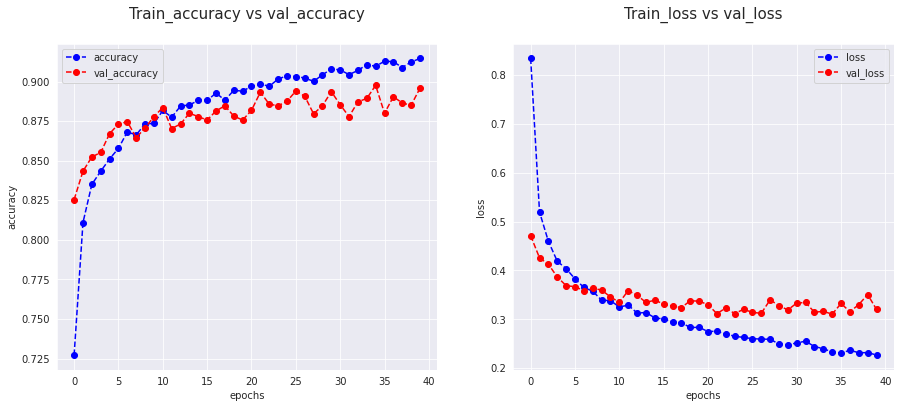

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(15,6))
    
# Plot accuracy
ax= axes[0]
ax.plot(hist.history['accuracy'],'bo--', label = "accuracy")
ax.plot(hist.history['val_accuracy'], 'ro--', label = "val_accuracy")
ax.set_title("Train_accuracy vs val_accuracy\n", fontsize=15)
ax.set_ylabel("accuracy")
ax.set_xlabel("epochs")
ax.legend()

# Plot loss function
ax= axes[1]
ax.plot(hist.history['loss'],'bo--', label = "loss")
ax.plot(hist.history['val_loss'], 'ro--', label = "val_loss")
ax.set_title("Train_loss vs val_loss\n", fontsize=15)
ax.set_ylabel("loss")
ax.set_xlabel("epochs")
ax.legend()

## Third try

We fit a model to predict based on the global average pooling of other pretrained models. 

The idea behind combining models is to increase the number of features detected by the model on which we make the predictions 

In [ ]:
#We choose the 3 best performing models : resnet50, resnet101 and VGG19

#Loading the models :
resnet101 = tf.keras.applications.resnet.ResNet101(input_shape=image_shape, weights="imagenet", include_top=False)
resnet101._name = "model_resnet101_GAP"

resnet50 = tf.keras.applications.resnet.ResNet50(input_shape=image_shape, weights="imagenet", include_top=False)
resnet50._name = "model_resnet50_GAP"

VGG19 = tf.keras.applications.vgg19.VGG19(input_shape=image_shape, weights ="imagenet", include_top=False)
VGG19._name = "model_VGG19_GAP"

#Importing preprocessing functions : 
from tensorflow.keras.applications import resnet
from tensorflow.keras.applications import vgg19

#Creating the data generators : 
train_image_data_generator_ensemble=ImageDataGenerator(
                                rotation_range=20, 
                                width_shift_range=0.1, 
                                height_shift_range=0.1,
                                brightness_range=[0.4,1.5],
                                shear_range=0.1,
                                zoom_range=0.2,
                                horizontal_flip=True,
                                vertical_flip=True,
                                validation_split=0.2)

train_generator_ensemble = train_image_data_generator_ensemble.flow_from_directory(
                                                                    train_path,
                                                                    target_size=image_shape[:2],
                                                                    shuffle=True,
                                                                    batch_size=batch_size,
                                                                    subset="training"
                                                                )


valid_generator_ensemble = train_image_data_generator_ensemble.flow_from_directory(
                                                                        train_path,
                                                                        target_size=image_shape[:2],
                                                                        shuffle=True,
                                                                        batch_size=batch_size,
                                                                        subset="validation"
                                                                    )

test_generator_ensemble = ImageDataGenerator().flow_from_directory(
                                                        test_path,
                                                        target_size=image_shape[:2],
                                                        shuffle=True, 
                                                        batch_size=batch_size
                                                    )

def mygen2(image_gen):
  for x,y in image_gen:
    yield [resnet.preprocess_input(x),resnet.preprocess_input(x), vgg19.preprocess_input(x)], y


final_train_gen_ensemble = mygen2(train_generator_ensemble)
final_valid_gen_ensemble = mygen2(valid_generator_ensemble)
final_test_gen_ensemble = mygen2(test_generator_ensemble)

#Renaming model layers : 
input_models= [resnet101,resnet50,  VGG19]

for model in input_models : 
    for layer in model.layers : 
        layer._name = model.name+"_"+layer.name

#Setting train to false 
for model in input_models : 
    for layer in model.layers : 
            layer.trainable= False

80134624/80134624 [==============================] - 0s 0us/step
Found 11230 images belonging to 6 classes.
Found 2804 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


In [ ]:
#Building the model : 
from tensorflow.keras.layers import concatenate , Dropout
from tensorflow.keras.optimizers import Adam


resnet101_2 = GlobalAveragePooling2D()(resnet101.output)
resnet50_2 = GlobalAveragePooling2D()(resnet50.output)
VGG19_2 = GlobalAveragePooling2D()(VGG19.output)


concat_layer= concatenate([resnet101_2,resnet50_2, VGG19_2])#Layer containing the global average pooling outputs 

z=Dense(2048, activation="relu")(concat_layer)
z=Dropout(0.6)(z)
z=Dense(1024, activation="relu")(concat_layer)
z=Dropout(0.5)(z)
z=Dense(64, activation="relu")(z)
final = Dense(len(train_generator_ensemble.class_indices), activation="softmax")(z)


model_ensemble_GAP = Model(inputs= [resnet101.input,resnet50.input, VGG19.input], outputs= final)

model_ensemble_GAP._name="Model_ensemble_GAP"
print(f"Number of layers in the ensemble model : {len(model_ensemble_GAP.layers)}")

model_ensemble_GAP.compile(loss="categorical_crossentropy", optimizer=Adam(learning_rate=0.0001), metrics=["accuracy"])

Number of layers in the ensemble model : 550


In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(model_ensemble_GAP, to_file='model_ensemble_GAP_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
hist = model_ensemble_GAP.fit(final_train_gen_ensemble,
                      steps_per_epoch = train_generator_ensemble.samples // batch_size,
                      validation_data=final_valid_gen_ensemble, 
                      validation_steps = valid_generator_ensemble.samples // batch_size,
                      epochs=60,     
            callbacks =[
              tf.keras.callbacks.EarlyStopping(
                  monitor="loss", patience=5, restore_best_weights=True),
             tf.keras.callbacks.ModelCheckpoint(
                 filepath =checkpoints_path+f"{model_ensemble_GAP.name}_best_val_loss.h5", 
                 save_weights_only=False, 
                 monitor="val_loss",
                 mode="min",
                 save_best_only=True)])

Epoch 1/60
350/350 [==============================] - 156s 391ms/step - loss: 1.0563 - accuracy: 0.6635 - val_loss: 0.4806 - val_accuracy: 0.8233
Epoch 2/60
350/350 [==============================] - 134s 371ms/step - loss: 0.5855 - accuracy: 0.7858 - val_loss: 0.4580 - val_accuracy: 0.8297
Epoch 3/60
350/350 [==============================] - 128s 366ms/step - loss: 0.5153 - accuracy: 0.8089 - val_loss: 0.4255 - val_accuracy: 0.8502
Epoch 4/60
350/350 [==============================] - 129s 369ms/step - loss: 0.4721 - accuracy: 0.8253 - val_loss: 0.4032 - val_accuracy: 0.8581
Epoch 5/60
350/350 [==============================] - 128s 365ms/step - loss: 0.4590 - accuracy: 0.8310 - val_loss: 0.3828 - val_accuracy: 0.8660
Epoch 6/60
350/350 [==============================] - 128s 366ms/step - loss: 0.4251 - accuracy: 0.8433 - val_loss: 0.3933 - val_accuracy: 0.8588
Epoch 7/60
350/350 [==============================] - 128s 365ms/step - loss: 0.4004 - accuracy: 0.8541 - val_loss: 0.3639 -

In [ ]:
model_ensemble_GAP._name="Model_ensemble_GAP"
loss, acc  = model_ensemble_GAP.evaluate(final_test_gen_ensemble, steps=test_generator_ensemble.samples//batch_size+1)
save_dicts(model_ensemble_GAP.name , loss, acc)
print("Accuracy of the last iteration model on the test dataset : ", np.round(acc*100,3),"%")
model_ensemble_GAP.save(model_path+f"{model_ensemble_GAP.name}.h5")

model_best_val= keras.models.load_model(checkpoints_path+f"{model_ensemble_GAP.name}_best_val_loss.h5")
model_best_val._name = "Model_ensemble_GAP_best_val_loss"
loss, acc  = model_best_val.evaluate(final_test_gen_ensemble, steps=test_generator_ensemble.samples//batch_size+1)
save_dicts(model_best_val.name , loss, acc)
print("Accuracy of the model with the best validation loss on the test dataset : ", np.round(acc*100,3),"%")
model_best_val.save(model_path+f"{model_best_val.name}.h5")

94/94 [==============================] - 26s 280ms/step - loss: 0.2401 - accuracy: 0.9137
Accuracy of the last iteration model on the test dataset :  91.367 %
94/94 [==============================] - 26s 242ms/step - loss: 0.3633 - accuracy: 0.8697
Accuracy of the model with the best validation loss on the test dataset :  86.967 %


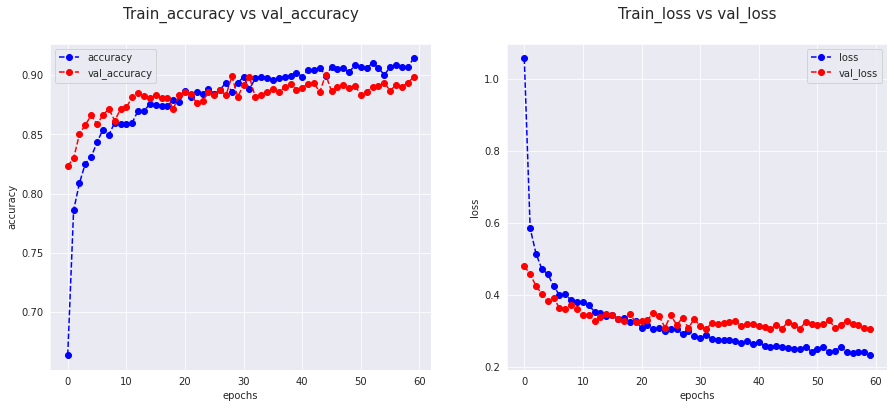

In [ ]:
fig, axes = plt.subplots(1,2, figsize=(15,6))
    
# Plot accuracy
ax= axes[0]
ax.plot(hist.history['accuracy'],'bo--', label = "accuracy")
ax.plot(hist.history['val_accuracy'], 'ro--', label = "val_accuracy")
ax.set_title("Train_accuracy vs val_accuracy\n", fontsize=15)
ax.set_ylabel("accuracy")
ax.set_xlabel("epochs")
ax.legend()

# Plot loss function
ax= axes[1]
ax.plot(hist.history['loss'],'bo--', label = "loss")
ax.plot(hist.history['val_loss'], 'ro--', label = "val_loss")
ax.set_title("Train_loss vs val_loss\n", fontsize=15)
ax.set_ylabel("loss")
ax.set_xlabel("epochs")
ax.legend()

The results of the ensemble do not improve the previous models we trained.

# Final results 

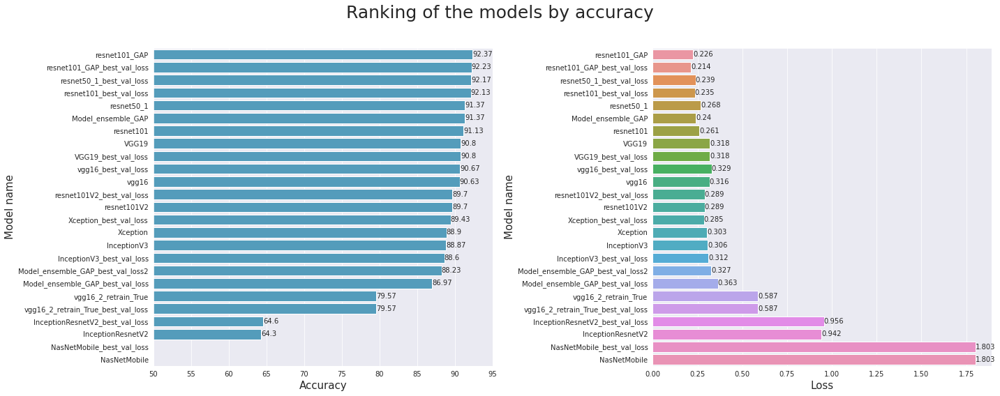

In [ ]:
model_paths =  glob(model_path+"*")
dict_acc= np.load(acc_dict_path, allow_pickle="TRUE").item()
dict_loss= np.load(loss_dict_path, allow_pickle="TRUE").item()

df_results = pd.DataFrame(columns=["Path","Model_name","loss","accuracy"])
for path in model_paths : 
    df_results=df_results.append({"Path":path, "Model_name":path[80:-3], "loss": dict_loss[path[80:-3]], "accuracy":dict_acc[path[80:-3]]}, ignore_index=True)

df_results["rounded_accuracy"] = np.round(df_results["accuracy"]*100,2)
df_results["rounded_loss"] = np.round(df_results["loss"],3)

df_results.head()

fig, axes = plt.subplots(1,2, figsize=(20,8))

ax=axes[0]
p=sns.barplot(data =df_results.sort_values("accuracy",ascending=False), y="Model_name",x="rounded_accuracy",color="#43a3cc", ax=ax)
ax.set_ylabel("Model name",fontsize=15)
ax.set_xlabel("Accuracy",fontsize=15)
ax.set_xlim((50,95))
for i in p.containers:
    p.bar_label(i,fontsize=10)

ax=axes[1]
p=sns.barplot(data =df_results.sort_values("accuracy",ascending=False), y="Model_name",x="rounded_loss",ax=ax)
ax.set_ylabel("Model name",fontsize=15)
ax.set_xlabel("Loss",fontsize=15)
for i in p.containers:
    p.bar_label(i,fontsize=10)

plt.suptitle("Ranking of the models by accuracy\n",fontsize=25)
plt.tight_layout()

We can conclude that we obtain the best results with resnet101 model using Global Average Pooling. 
It has slightly better accuracy than other Resnet101 but its loss is significantly better

# Predictions on unlabelled dataset :

In [ ]:
#Loading model 
final_model= keras.models.load_model(f"{model_path}resnet101_GAP.h5")

#Preprocess function : 
from tensorflow.keras.applications.resnet import preprocess_input

#Creating prediction generator : 
image_files = glob(pred_path+"/*")
images = []
for file in image_files :
    img = preprocess_input(img_to_array(load_img(file, target_size=image_shape[:2]))) 
    images.append(img)



In [ ]:
predictions= final_model.predict(np.array(images))

229/229 [==============================] - 31s 90ms/step


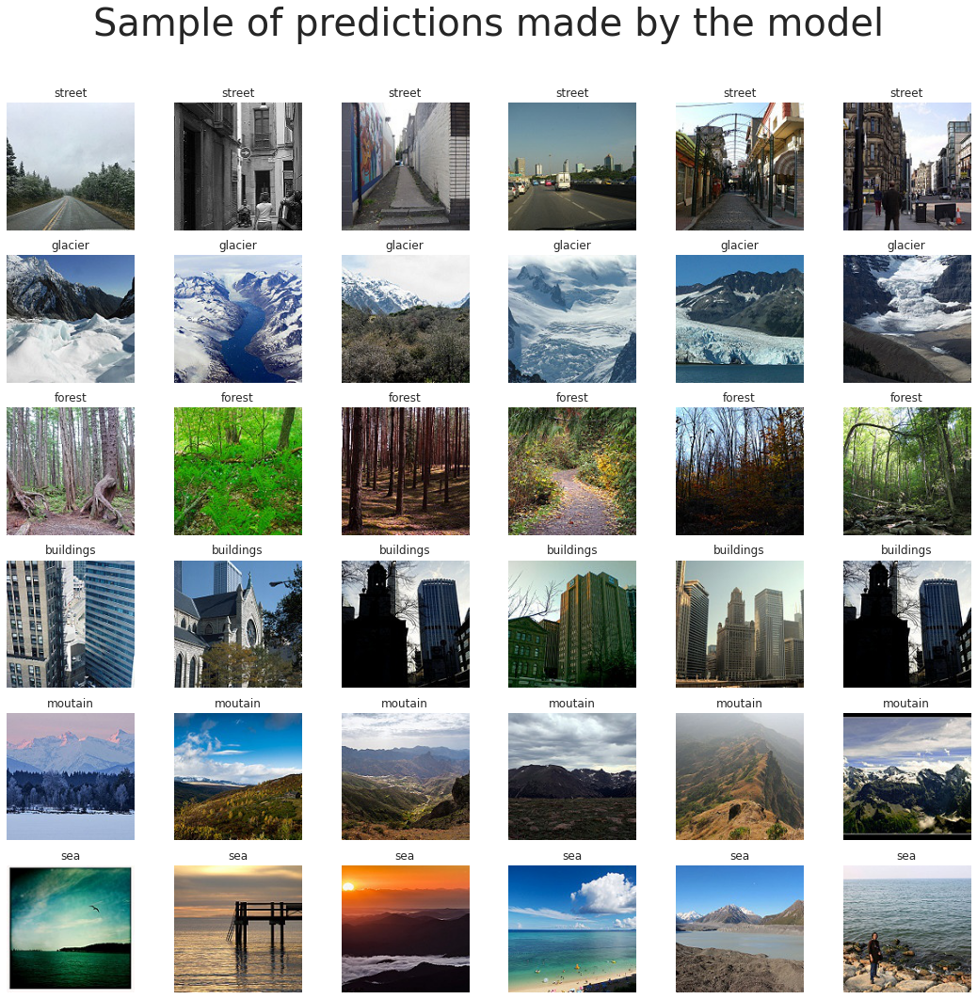

In [ ]:
index_to_class= {0:"buildings",1: "forest",2:"glacier", 3:"moutain",4:"sea", 5:"street"}

df_preds=pd.DataFrame()
df_preds["images"]=image_files
df_preds["class_index"]=np.argmax(predictions,axis=1)
df_preds["class"]=df_preds["class_index"].map(index_to_class)

plot_sample_images(df_preds, 6, "Sample of predictions made by the model\n")

The final predictions seem consistent.

# Possible improvements 

* To further improve the results we could try other methods of data augmentation such as Mixing images , random erasing or deep learning based methods like neural style transfer. ([Survey on data augmentation methods](https://journalofbigdata.springeropen.com/articles/10.1186/s40537-019-0197-0))
* We could also optimize the hyper parameters of the fully connected layers of the model (adding drop out, kernel regularization, more / less layers, more / less neurons in them). Or the compiling and fitting parameters : changing optimizer, learning rate, momumtum, batch size and the number of epochs 